In [3]:
#  Import necessary libraries and functions

import numpy as np
import astropy.units as u
import astropy.constants as c
from scipy.optimize import fsolve
from scipy.interpolate import UnivariateSpline, interp1d
import matplotlib.pyplot as plt
import lal
import lalsimulation as lalsim
import os
import sys
sys.path.append("./data/")
#from data import PACKAGE_FILENAMES

def compute_isco(chi_bh):
    '''
    This function takes as input the aligned spin component of the BH and
    returns the innermost stable circular orbit radius normalized by the mass
    of the BH.
    '''
    if not np.all([np.abs(chi_bh) <= 1.0]):
        raise ValueError('|chi1| must be less than 1.0')
    Z1 = 1.0 + ((1.0 - chi_bh**2)**(1. / 3.)) * ((1 + chi_bh)**(1. / 3.) +
                                             (1 - chi_bh)**(1. / 3.))
    Z2 = np.sqrt(3 * chi_bh**2 + Z1**2)
    r_isco = 3 + Z2 - np.sign(chi_bh) * np.sqrt((3 - Z1) * (3 + Z1 + 2 * Z2))
    return r_isco

def spins_to_chi_eff(m1, m2, chi1, chi2):
    '''
    This function returns the effective spin of the system
    '''
    chi_eff = (chi1*m1 + chi2*m2)/(m1 + m2)
    return chi_eff


def _lalsim_neutron_star_radius(m, max_mass, fam):
    '''Return neutron star radius in meters'''
    if m > max_mass:
        return m * 1500  # 1 solar mass = 1500m
    else:
        try:
            return lalsim.SimNeutronStarRadius(m * lal.MSUN_SI, fam)
        except RuntimeError:
            # FIXME handle RuntimeError for edge cases
            # Raised if m is close to max_mass
            # GSL function failed: interpolation error (errnum=1)
            # XLAL Error - <GSL function> (interp.c:150): Generic failure
            return m * 1500


def _r_ns_from_lal_simulation(m_ns, eosname):
    eos = lalsim.SimNeutronStarEOSByName(eosname)
    fam = lalsim.CreateSimNeutronStarFamily(eos)
    max_mass = lalsim.SimNeutronStarMaximumMass(fam) / c.M_sun.value
    try:
        iter(m_ns)
        R_ns = np.array([_lalsim_neutron_star_radius(m, max_mass, fam)
                        for m in m_ns])
    except TypeError:
        R_ns = _lalsim_neutron_star_radius(m_ns, max_mass, fam)
    return R_ns, max_mass


def _compactness_baryon_mass(m_ns, r_ns):
    C_ns = c.G * m_ns * c.M_sun / (r_ns * u.m * c.c**2)
    C_ns = C_ns.value

    d1 = 0.619
    d2 = 0.1359
    BE = (d1 * C_ns + d2 * C_ns * C_ns) * m_ns  # arXiv:1601.06083 (Eq: 21)
    m2_b = m_ns + BE  # Baryonic mass - Gravitational mass = Binding Energy
    return [C_ns, m2_b]


def max_mass_from_eosname(eosname):
    if eosname == "2H":
        max_mass = 2.834648092299807
    else:
        eos = lalsim.SimNeutronStarEOSByName(eosname)
        fam = lalsim.CreateSimNeutronStarFamily(eos)
        max_mass = lalsim.SimNeutronStarMaximumMass(fam) / c.M_sun.value
    return max_mass

def computeCompactness(M_ns, eosname='2H', max_mass=None):
    '''
    Return the neutron star compactness as a function of mass
    and equation of state or radius

    Parameters
    ----------
    M_ns : array_like
        Neutron star mass in solar masses
    eosname : str or interp1d
        Neutron star equation of state to be used
    max_mass : float
        Maximum mass of neutron star.

    Returns
    -------
    [C_ns, m2_b, max_mass]
        Compactness, baryon mass and maximum neutron star mass
        in solar masses.

    Notes
    -----
    The radius and maximum mass of the neutron star is
    inferred based on the equation of state supplied.
    Max mass only needs to be supplied for EoS marginalization.

    Examples
    --------
    >>> computeCompactness(2.8)
    [array(0.298), array(3.354), 2.834]
    >>> computeDiskMass.computeCompactness(2.9, eosname='AP4')
    [0.5, 0.0, 2.212]
    >>> m_ns = np.array([1.1, 1.2, 1.3])
    >>> computeDiskMass.computeCompactness(m_ns, eosname='AP4')
    [array([0.141, 0.154, 0.167]), array([1.199, 1.318, 1.439]), 2.212]
    '''
    if isinstance(eosname, interp1d):
        # find R as a function of M
        R_ns = eosname(M_ns)
        C_ns, m2_b = _compactness_baryon_mass(M_ns, R_ns)
    elif eosname != '2H':
        # infer radius and maximum mass based on lalsimulation EoS
        R_ns, max_mass = _r_ns_from_lal_simulation(M_ns, eosname)
        C_ns, m2_b = _compactness_baryon_mass(M_ns, R_ns)
    else:
        with open(PACKAGE_FILENAMES['equil_2H.dat'], 'rb') as f:
            M_g, M_b, Compactness = np.loadtxt(f, unpack=True)
        max_mass = max_mass_from_eosname("2H")
        s = UnivariateSpline(M_g, Compactness, k=5)
        s_b = UnivariateSpline(M_g, M_b, k=5)
        C_ns = s(M_ns)
        m2_b = s_b(M_ns)
    try:
        C_ns[M_ns > max_mass] = 0.5  # BH compactness set to 0.5
        m2_b[M_ns > max_mass] = 0.0  # BH baryon mass set to 0.0
    except TypeError:  # if C_ns is not an array
        if M_ns > max_mass:
            C_ns = 0.5
            m2_b = 0.0
    return [C_ns, m2_b, max_mass]

/tmp/ipykernel_2326/192373456.py:9: UserWarning: Wswiglal-redir-stdio:

SWIGLAL standard output/error redirection is enabled in IPython.
This may lead to performance penalties. To disable locally, use:

with lal.no_swig_redirect_standard_output_error():
    ...

To disable globally, use:

lal.swig_redirect_standard_output_error(False)

Note however that this will likely lead to error messages from
LAL functions being either misdirected or lost when called from
Jupyter notebooks.

To suppress this warning, use:

import warnings
warnings.filterwarnings("ignore", "Wswiglal-redir-stdio")
import lal

  import lal


In [4]:
# NMMA import
import nmma.em.io as io
from nmma.em.model import SimpleKilonovaLightCurveModel, SVDLightCurveModel
from nmma.em import model_parameters


Install afterglowpy if you want to simulate afterglows.
Install wrapt_timeout_decorator if you want timeout simulations.


In [5]:
# Fitting formula functions
def dyn_ej(a = -9.3335, b = 114.17, d = -337.56, n = 1.5465, M1 = 1.4, R1 = 10, M2 = 1.4, R2 = 10):
    C1 = 1.476625 * M1 / R1
    C2 = 1.476625 * M2 / R2
    x = (a/C1 + b*(M2**n/M1**n) + d*C1)*M1 + (a/C2 + b*(M1**n/M2**n) + d*C2)*M2
    if x < 0:
        return 0
    else:
        return x/1000
    
def wind_ej(M1, M2, a0=-1.581, deltaa=-2.439, b0=-0.538, deltab=-0.406, c=0.953, d=0.0417, beta=3.91, qtrans=0.9, Mtov=1.97, R16=11.137): 
    Mtresh = (2.38 - 3.606 * (Mtov/R16))*Mtov
    q = M2/M1
    xsi = 0.5 * np.tanh(beta * (q - qtrans))
    a = a0 + deltaa * xsi
    b = b0 + deltab * xsi
    mwind = a * (1 + b * np.tanh( (c - (M1+M2)/Mtresh)/d ))
    if -3 > mwind:
        return -3
    else:
        return mwind

# Import EOS and build M(R) 

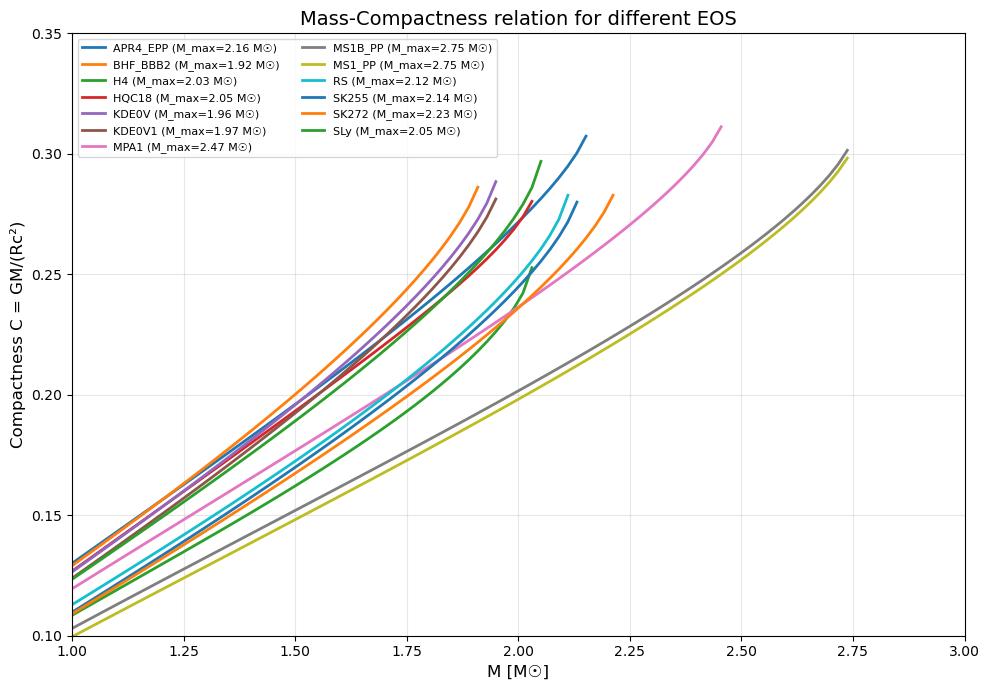

In [6]:
# Import the EOS  

# Define mass grid
M_ns_grid = np.linspace(1.0, 3.0, 100)  # Masses ranging from 1.0 to 3.0 M☉

# EOS names
eos_names = ['APR4_EPP', 'BHF_BBB2', 'H4', 'HQC18', 'KDE0V', 'KDE0V1', 
             'MPA1', 'MS1B_PP', 'MS1_PP', 'RS', 'SK255', 'SK272', 'SLy']

# Create figure
fig, ax = plt.subplots(figsize=(10, 7))

Compactness_dic = {}

# Calculate and plot compactness for each EOS
for eos_name in eos_names:
    try:
        C_ns, m2_b, max_mass = computeCompactness(M_ns_grid, eosname=eos_name)
        
        # Filter out values where mass exceeds maximum mass
        valid_mask = M_ns_grid <= max_mass

        # Dictionary to store results
        Compactness_dic[eos_name] = (M_ns_grid[valid_mask], C_ns[valid_mask], max_mass)
        
        ax.plot(M_ns_grid[valid_mask], C_ns[valid_mask], 
                label=f'{eos_name} (M_max={max_mass:.2f} M☉)', linewidth=2)
        
    except Exception as e:
        print(f"⚠ Erreur pour {eos_name}: {e}")

ax.set_xlabel('M [M☉]', fontsize=12)
ax.set_ylabel('Compactness C = GM/(Rc²)', fontsize=12)
ax.set_title('Mass-Compactness relation for different EOS', fontsize=14)
ax.legend(loc='best', fontsize=8, ncol=2)
ax.grid(True, alpha=0.3)
ax.set_xlim(1.0, 3.0)
ax.set_ylim(0.1, 0.35)

plt.tight_layout()
plt.show()

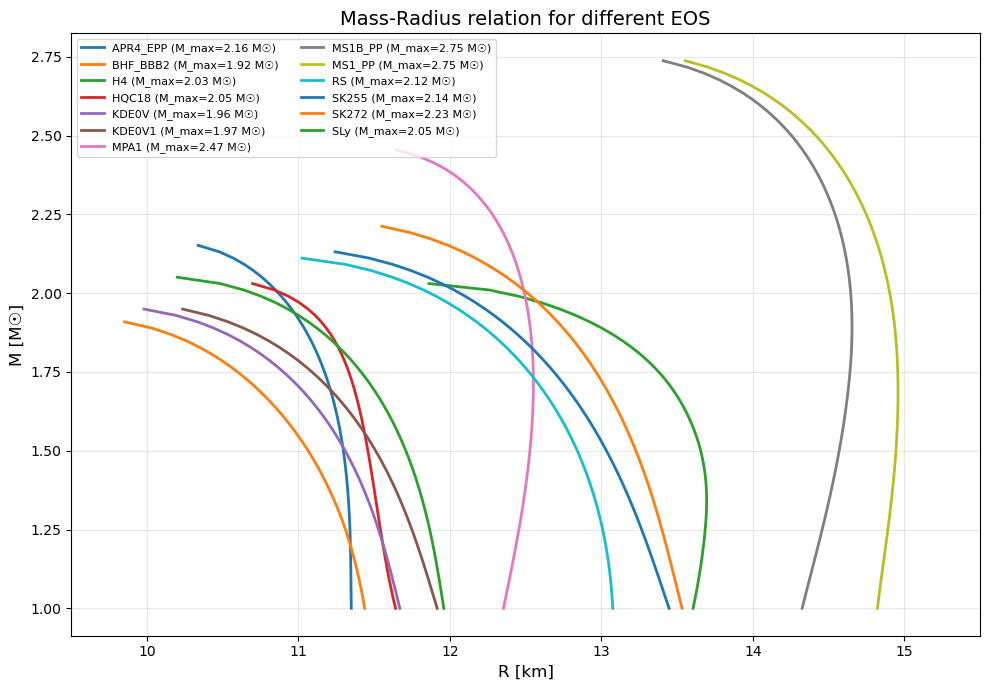

In [7]:
# Build the radius from the definition of compactness

fig, ax = plt.subplots(figsize=(10, 7))

for eos_name, (masses, compactness, max_mass) in Compactness_dic.items():
    # Compute radius in km
    radius_km = (c.G * masses * c.M_sun / (compactness * c.c**2)).to(u.km).value
    # Update the dictionary with the new column
    Compactness_dic[eos_name] = {
        'mass_solar': masses,
        'compactness': compactness,
        'radius_km': radius_km,
        'max_mass': max_mass
    }
    ax.plot(radius_km, masses, label=f'{eos_name} (M_max={max_mass:.2f} M☉)', linewidth=2)
ax.set_xlabel('R [km]', fontsize=12)
ax.set_ylabel('M [M☉]', fontsize=12)
ax.set_title('Mass-Radius relation for different EOS', fontsize=14)
ax.legend(loc='best', fontsize=8, ncol=2)
ax.grid(True, alpha=0.3)
ax.set_xlim(9.5, 15.5)

plt.tight_layout()
plt.show()

# Various function used for the analysis

In [6]:
# V3 of the function : now returns fig, ax 
def ejecta_plot_v3(eos_name, model_name='Bu2019lm', model_param={"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0}, filters=['ztfr', 'ztfi', 'ztfg'], plot=True, title=None, get_fig=False):
    '''Plot the ejecta properties for a given EOS model.
    Parameters
    ----------
    eos_name : str
        Name of the equation of state (EOS) to be used.
    title : str
        Title for the plots.
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm'). Attention: : the model must have parameters "log10_mej_dyn" and "log10_mej_wind".
    model_param : dict, optional
        Parameters for the SVD model (default is {"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0}).
    filters : list, optional
        Filters to be used for the light curve.
    plot : bool, optional
        Whether to display the plots (default is True).
    get_fig : bool, optional
        Whether to return the figure and axes objects (default is False).
    -----------
    Returns a dictionary with ejecta masses and magnitudes and optionally the figure and axes objects.
    -----------
    '''
    import matplotlib.colors as colors
    import matplotlib.pyplot as plt
    %matplotlib inline

    d = Compactness_dic[eos_name]
    name = eos_name
    print(f"Processing EOS: {name}")
    
    # Create mass pairs
    Mr = d['mass_solar']
    Rr = d['radius_km']

    pair_mass = []
    for i, m1 in enumerate(Mr):
        for j, m2 in enumerate(Mr):
            if m1 > m2:
                pair_mass.append((m1,m2))
    pair_array = np.array(pair_mass)
    n_pairs = pair_array.shape[0]

    # Prepare arrays to store results
    fit_masses = np.zeros(n_pairs)
    wind_log = np.zeros(n_pairs)

    # Retrieve the radius for 1.6 M_solar NS
    target_mass = 1.6
    try:
        masses_eos = d['mass_solar']
        idx_eos = int(np.argmin(np.abs(masses_eos - target_mass)))
        mass_eos = masses_eos[idx_eos]
        radius16 = d['radius_km'][idx_eos]
    except Exception as e:
        print(f"  - {name}: erreur ->", e)

    # Compute ejecta masses for each pair
    for idx, (m1, m2) in enumerate(pair_array):
        idx1 = np.argmin(np.abs(Mr - m1))
        idx2 = np.argmin(np.abs(Mr - m2))
        R1 = Rr[idx1]
        R2 = Rr[idx2]
        fit_masses[idx] = dyn_ej(M1=m1, R1=R1, M2=m2, R2=R2)
        wind_log[idx] = wind_ej(m1, m2, Mtov=Mr.max(), R16=radius16)
    wind_linear = 0.3 * 10 ** (wind_log)
    total_mass = fit_masses +  wind_linear

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 5.0, 0.1
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    try:
        svd_model = SVDLightCurveModel(
            model=model_name,
            sample_times=sample_times_svd,
            svd_path=svd_path,
            mag_ncoeff=10,
            lbol_ncoeff=10,
            filters=filters
        )
    except Exception as e:
        print(f"  - {name}: erreur lors de la création du modèle SVD ->", e)
        return
    # Plotting

    # Convert to log scale for plotting and lightcurve calculation
    log_10wind = np.log10(0.3) + wind_log
    log_10dyn = np.zeros(n_pairs)
    for i, m in enumerate(fit_masses):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10total = np.log10(total_mass)
    
    # Compute magnitude using SVD model
    mags= np.zeros(n_pairs)
    peak_times = np.zeros(n_pairs)
    for idx, param in enumerate(zip(log_10dyn, log_10wind)):
        model_param.update({
            "log10_mej_dyn": param[0],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": param[1],              # log10(Masse éjectée par vent en M☉)
        })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)
        mag = np.min(mag_svd[filters[0]])
        mags[idx] = mag
        peak_times[idx] = np.argmin(mag_svd[filters[0]])
    if plot:
        if title is None:
            title = f'Ejecta properties for EOS: {eos_name}'

        fig, axes = plt.subplots(2, 2, figsize=(16, 16), sharey=True)

        # Top left: ejecta mass
        norm_ejecta = colors.LogNorm(vmin=total_mass.min(), vmax=total_mass.max())
        sc0 = axes[0,0].scatter(pair_array[:, 0], pair_array[:, 1], c=total_mass, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_ejecta)
        axes[0,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
        axes[0,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[0,0].set_title('Total mass')
        axes[0,0].grid(True, alpha=0.25)
        cbar0 = fig.colorbar(sc0, ax=axes[0,0], orientation='vertical', fraction=0.05)
        cbar0.set_label('$M_{total}$ [M$_\\odot$]')

        # text box for ejecta stats
        ejecta_stats = (f'Ejecta mass statistics:\n'
                    f'  - min: {total_mass.min():.1%} M$_\\odot$\n'
                    f'  - max: {total_mass.max():.1%} M$_\\odot$\n'
                    f'  - mean: {total_mass.mean():.1%} M$_\\odot$')
        axes[0,0].text(0.03, 0.97, ejecta_stats, transform=axes[0,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Top right: peak magnitude
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc1 = axes[0,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='viridis_r', s=300, edgecolors=None, linewidths=0.2, norm=norm_mag)
        axes[0,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
        axes[0,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[0,1].set_title(f'Peak absolute magnitude (filter: {filters[0]})')
        axes[0,1].grid(True, alpha=0.25)
        cbar1 = fig.colorbar(sc1, ax=axes[0,1], orientation='vertical', fraction=0.05)
        cbar1.set_label(f'$M_{{peak}}$ [mag] using {model_name}')

        # text box for mag
        mag_stats = (f'Magnitude statistics:\n'
                    f'  - min: {mags.min():.2f}\n'
                    f'  - max: {mags.max():.2f}\n'
                    f'  - mean: {mags.mean():.2f}')
        axes[0,1].text(0.03, 0.97, mag_stats, transform=axes[0,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Bottom left: dyn ejecta mass
        norm_dyn = colors.SymLogNorm(vmin=0, vmax=fit_masses.max(), linthresh=1e-4, linscale=0.5)
        sc2 = axes[1,0].scatter(pair_array[:, 0], pair_array[:, 1], c=fit_masses, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_dyn)
        axes[1,0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
        axes[1,0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[1,0].set_title('Dynamical ejecta mass')
        axes[1,0].grid(True, alpha=0.25)
        cbar2 = fig.colorbar(sc2, ax=axes[1,0], orientation='vertical', fraction=0.05)
        cbar2.set_label('$M_{dyn}$ [M$_\\odot$]')

        # text box for dyn ejecta stats
        dyn_stats = (f'Dynamical ejecta mass statistics:\n'
                    f'  - min: {fit_masses.min():.1%} M$_\\odot$\n'
                    f'  - max: {fit_masses.max():.1%} M$_\\odot$\n'
                    f'  - mean: {fit_masses.mean():.1%} M$_\\odot$')
        axes[1,0].text(0.03, 0.97, dyn_stats, transform=axes[1,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))

        # Bottom right: wind ejecta mass
        norm_wind = colors.LogNorm(vmin=10e-5, vmax=wind_linear.max())
        sc3 = axes[1,1].scatter(pair_array[:, 0], pair_array[:, 1], c=wind_linear, cmap='viridis', s=300, edgecolors=None, linewidths=0.2, norm=norm_wind)
        axes[1,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12) 
        axes[1,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
        axes[1,1].set_title('Wind ejecta mass')
        axes[1,1].grid(True, alpha=0.25)
        cbar3 = fig.colorbar(sc3, ax=axes[1,1], orientation='vertical', fraction=0.05)
        cbar3.set_label('$M_{wind}$ [M$_\\odot$]')
        
        # text box for wind ejecta stats
        wind_stats = (f'Wind ejecta mass statistics:\n'
                    f'  - min: {wind_linear.min():.2%} M$_\\odot$\n'
                    f'  - max: {wind_linear.max():.1%} M$_\\odot$\n'
                    f'  - mean: {wind_linear.mean():.1%} M$_\\odot$')
        axes[1,1].text(0.03, 0.97, wind_stats, transform=axes[1,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=0.85, edgecolor='0'))
        
        plt.suptitle(title, fontsize=16, y=1.0002)

        plt.tight_layout()
        plt.show()

    if get_fig:
        return fig, axes, {
        "model_param": model_param,
        "magnitude": mags,
        "fit_masses": fit_masses,
        "wind_linear": wind_linear,
        "pair_array": pair_array,
        "filter": filters,
        "times": peak_times
        }
    else:
        return {
        "model_param": model_param,
        "magnitude": mags,
        "fit_masses": fit_masses,
        "wind_linear": wind_linear,
        "pair_array": pair_array,
        "filter": filters,
        "times": peak_times
        }

In [7]:
# Interactive plot to select points and get their parameters

def get_indices(dic):
    """Return the list of selected indices for a mag-mass plot.
    Parameters
    ----------
    dic : dict
        Dictionary containing 'pair_array' and 'magnitude' keys (returned by ejecta_plot_v2).
    ----------
    Returns
        selected_indices : list
            List of selected indices.
    """

    import matplotlib
    matplotlib.use('TkAgg')  # Use TkAgg backend as fallback
    %matplotlib widget 
    # Use widget backend for interactivity in Jupyter
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors

    def onclick(event):
        """Function to handle click events on the plot."""
        if event.inaxes is None:
            return

        # Get click coordinates
        m1_click = event.xdata
        m2_click = event.ydata

        # Find the closest point in the scatter plot
        distances = np.sqrt((dic['pair_array'][:, 0] - m1_click)**2 + (dic['pair_array'][:, 1] - m2_click)**2)
        closest_idx = np.argmin(distances)
        
        # Add the index to the list if not already selected
        if closest_idx in selected_indices:
            print(f"Point {closest_idx} already selected.")
            return
        else:
            selected_indices.append(closest_idx)

        # Mark the selected point
        event.inaxes.scatter(dic['pair_array'][closest_idx, 0], dic['pair_array'][closest_idx, 1], 
                            c='cyan', s=400, marker='*', linewidths=2,
                            zorder=10)
        event.inaxes.text(dic['pair_array'][closest_idx, 0], dic['pair_array'][closest_idx, 1], 
                        f'  {len(selected_indices)}', fontsize=12, fontweight='bold',
                        color='cyan', zorder=11)
        plt.draw()
        

    selected_indices = []

    # Create interactive plot
    fig, ax = plt.subplots(figsize=(12, 10))

    norm_mag = colors.Normalize(vmin=dic['magnitude'].min(), vmax=dic['magnitude'].max())
    sc = ax.scatter(dic['pair_array'][:, 0], dic['pair_array'][:, 1], c=dic['magnitude'], cmap='inferno_r', 
                    s=300, edgecolors=None, linewidths=0.2, norm=norm_mag)
    ax.set_xlabel('$M_1$ [$M_\\odot$]', fontsize=14)
    ax.set_ylabel('$M_2$ [$M_\\odot$]', fontsize=14)
    ax.set_title('Peak magnitude - Click to select points', fontsize=16)
    ax.grid(True, alpha=0.25)

    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', fraction=0.05)
    cbar.set_label('$M_{{peak}}$ [mag]', fontsize=12)

    # Connect the click event to the handler
    cid = fig.canvas.mpl_connect('button_press_event', onclick)

    plt.tight_layout()
    plt.show()

    %matplotlib inline  
    # Switch back to inline backend

    return selected_indices


In [8]:
# Modification of the plot_indices function

def plot_lc_for_indices_v3(selected_indices, dic, title, filters_band, model_name='Bu2019lm'):
    """Plot the lightcurves for the selected indices and print their parameters.
    Parameters
    ----------
    selected_indices : list
        List of selected indices.
    dic : dict
        Dictionary containing 'pair_array', 'magnitude', 'fit_masses', 'wind_linear', and 'model_param' keys (returned by ejecta_plot_v2).
    title : str
        Title for the plot.
    filters_band : list
        List of filters to be used for the plot.
    model_name : str, optional
        Name of the SVD model to be used (default is 'Bu2019lm') Ideally the same model used in ejecta_plot_v2.
    ----------
    """
    %matplotlib inline
    import matplotlib.pyplot as plt
    import matplotlib.colors as colors
    from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

    for idx in selected_indices:
        print(f"Selected point (index {idx}):")
        print(f"  M1: {dic['pair_array'][idx, 0]:.3f} M☉")
        print(f"  M2: {dic['pair_array'][idx, 1]:.3f} M☉")
        print(f"  Magnitude: {dic['magnitude'][idx]:.2f}")
        print(f"  M_dyn: {dic['fit_masses'][idx]:.4f} M☉")
        print(f"  M_wind: {dic['wind_linear'][idx]:.4f} M☉")

        print()

    # Setup SVD model
    svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
    tmin_svd, tmax_svd, dt_svd = 0.1, 19.9, 0.1
    sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
    svd_model = SVDLightCurveModel(
        model=model_name,
        sample_times=sample_times_svd,
        svd_path=svd_path,
        mag_ncoeff=10,
        lbol_ncoeff=10,
        filters=filters_band
        )

    # Extract data from dictionary
    log_10dyn = np.zeros(len(dic['fit_masses']))
    for i, m in enumerate(dic['fit_masses']):
        if m > 0:
            log_10dyn[i] = np.log10(m)
        else:
            log_10dyn[i] = -5  
    log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'])
    pair_array = dic['pair_array']
    mags = dic['magnitude']
    n_points = len(selected_indices)
    model_param = dic['model_param']
    filter = dic['filter']

    # Plot lc in g r i bands
    # 2 col per point: lc + position on the grid

    fig, axes = plt.subplots(n_points, 2, figsize=(18, 6*n_points), gridspec_kw={'width_ratios': [2.25, 1]})
    # Ensure axes is always 2D
    if n_points == 1:
        axes = axes.reshape(1, -1)

    for i, idx in enumerate(selected_indices):

        model_param.update({
            "log10_mej_dyn": log_10dyn[idx],              # log10(Masse éjectée dynamique en M☉)
            "log10_mej_wind": log_10wind[idx],              # log10(Masse éjectée par vent en M☉)
            })
        _, mag_svd = svd_model.generate_lightcurve(sample_times_svd, model_param)

        # Get corresponding Bulla dataset file (closest match if exact not found)
        Bulla_parameters = {
            'mejdyn': 10**log_10dyn[idx],
            'mejwind': 10**log_10wind[idx],
            'phi': model_param['KNphi'],
            'theta': model_param['KNtheta'],
            'dMpc': 0
        }
        low_params_file = bulla_dataset.get_file(**Bulla_parameters, load_data=True)
        if low_params_file is None:
            closest_file = None
            closest_distance = float('inf') # Initialize with infinity
            for file in bulla_dataset.data_dict.values():
                params = file['params']
                distance = sum(np.sqrt((params.get(key, 0) - Bulla_parameters[key])**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance 
                if distance < closest_distance:
                    closest_distance = distance
                    closest_file = file
            low_params_file = closest_file
            print(f"Using closest match: {low_params_file['filename']} with params {low_params_file['params']}")
            low_params_file['data'] = np.loadtxt(low_params_file['filepath'])
            low_params_file['filters'] = bulla_dataset._extract_filters(low_params_file['filepath'])

        # Plot
        cols = [['red', 'darkred'], ['orange', '#d95f14'], ['cyan', 'darkcyan']]

        for (filter_name, color) in zip(filters_band, cols):
            axes[i,0].plot(sample_times_svd, mag_svd[filter_name], label=f'Model : {filter_name}', linewidth=2, color=color[0])
            if filter_name in low_params_file['filters']:
                filter_idx = low_params_file['filters'].index(filter_name)
                data = low_params_file['data']
                times = data[:, 0]
                axes[i,0].plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])
            else: # Horrible hack to match ps1__g r i filters due to naming inconsistency between NMMA and Bulla dataset
                if filter_name == 'ps1__g' :
                    filter_idx = low_params_file['filters'].index('ps1::g')
                    data = low_params_file['data']
                    times = data[:, 0]
                    axes[i,0].plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])
                if filter_name == 'ps1__r' :
                    filter_idx = low_params_file['filters'].index('ps1::r')
                    data = low_params_file['data']
                    times = data[:, 0]
                    axes[i,0].plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])
                if filter_name == 'ps1__i' :
                    filter_idx = low_params_file['filters'].index('ps1::i')
                    data = low_params_file['data']
                    times = data[:, 0]
                    axes[i,0].plot(times, data[:, filter_idx + 1], ls='--', label=f'Bulla dataset : {filter_name}', markersize=6, color=color[1])

        axes[i,0].invert_yaxis()
        axes[i,0].set_xlabel('Time [days]', fontsize=10)
        axes[i,0].set_ylabel('Absolute Magnitude', fontsize=10)
        axes[i,0].set_title(f'Model parameter : $M_{{dyn}}$={10**log_10dyn[idx]:.4f} M☉, $M_{{wind}}$={10**log_10wind[idx]:.4f} M☉, $\\phi$={model_param["KNphi"]:.2f}, $\\theta$={model_param["KNtheta"]:.2f}\nDataset parameter : $M_{{dyn}}$={low_params_file["params"]["mejdyn"]:.4f} M☉, $M_{{wind}}$={low_params_file["params"]["mejwind"]:.4f} M☉, $\\phi$={low_params_file["params"]["phi"]:.2f}, $\\theta$={low_params_file["params"]["theta"]:.2f}', fontsize=11)
        axes[i,0].legend(fontsize=8)
        axes[i,0].grid(True, alpha=0.3)

        # Zoom on peak
        axins = inset_axes(axes[i,0], width="20%", height="50%", loc='lower left')
        for (filter_name, color) in zip(filters_band, cols):
            axins.plot(sample_times_svd, mag_svd[filter_name], color=color[0])
            if filter_name in low_params_file['filters']:
                filter_idx = low_params_file['filters'].index(filter_name)
                data = low_params_file['data']
                times = data[:, 0]
                axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])
            else:
                if filter_name == 'ps1__g' :
                    filter_idx = low_params_file['filters'].index('ps1::g')
                    data = low_params_file['data']
                    times = data[:, 0]
                    axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])
                if filter_name == 'ps1__r' :
                    filter_idx = low_params_file['filters'].index('ps1::r')
                    data = low_params_file['data']
                    times = data[:, 0]
                    axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])
                if filter_name == 'ps1__i' :
                    filter_idx = low_params_file['filters'].index('ps1::i')
                    data = low_params_file['data']
                    times = data[:, 0]
                    axins.plot(times, data[:, filter_idx + 1], ls='--', color=color[1])

        # Set zoom limits
        lowest_mag = float('inf')
        for filter_name in filters_band:
            mag_filter = mag_svd[filter_name]
            min_mag = np.min(mag_filter)
            if min_mag < lowest_mag:
                lowest_mag = min_mag
                sametimes_min = sample_times_svd[np.argmin(mag_filter)]
        x1 = sametimes_min - 1
        x2 = sametimes_min +1
        y1 = lowest_mag - 0.5
        y2 = lowest_mag + 3.5
        axins.set_xlim(x1, x2)
        axins.set_ylim(y1, y2)
        axins.set_xticks([])
        axins.set_yticks([])
        axins.invert_yaxis()
        axins.set_title('Zoom on Peak', fontsize=10, pad=2, y=0.9)

        mark_inset(axes[i,0], axins, loc1=2, loc2=1, ec='none', lw=1)

        # Show position on the grid
        norm_mag = colors.Normalize(vmin=mags.min(), vmax=mags.max())
        sc = axes[i,1].scatter(pair_array[:, 0], pair_array[:, 1], c=mags, cmap='viridis_r', 
                            s=100, edgecolors=None, linewidths=0.2, norm=norm_mag)
        cbar = fig.colorbar(sc, ax=axes[i,1], orientation='vertical', fraction=0.05)
        cbar.set_label('peak $M_{AB}$', fontsize=10)
        axes[i,1].scatter(pair_array[idx, 0], pair_array[idx, 1], 
                        c='cyan', s=200, marker='*', linewidths=2,
                        zorder=10)
        axes[i,1].text(pair_array[idx, 0], pair_array[idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
        axes[i,1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=10)
        axes[i,1].set_title(f'Position on the grid (Peak Magnitude in {filters_band[0]} band)', fontsize=11)
        axes[i,1].grid(True, alpha=0.25)

    fig.suptitle(title, fontsize=16, y=1.0001)
    plt.tight_layout()
    plt.show()

# Bulla data set class 

In [9]:
class BullaDataset:
    """
    Class to load and manage the Bulla 2019 dataset files.
    """
    
    def __init__(self, folder_path):
        """
        Initialize the BullaDataset.
        
        Parameters:
        -----------
        folder_path : str
            Path to the folder containing the Bulla 2019 files
        """
        self.folder_path = folder_path
        self.files = []
        self.params_list = []
        self.data_dict = {}
        
        # Load all files 
        self._load_all_files()
        
        # Compute parameter ranges
        self._compute_param_ranges()
    
    def _load_all_files(self):
        """Load all .dat files from the folder."""
        import glob
        import os
        
        all_files = sorted([f for f in glob.glob(os.path.join(self.folder_path, '*.dat')) 
                           if not f.endswith('Zone.Identifier')])
        
        print(f"Loading {len(all_files)} Bulla 2019 files...")
        
        for filepath in all_files:
            filename = os.path.basename(filepath)
            params = self.Bulla_get_param(filename)

            # Create a unique key based on the parameters
            key = self._params_to_key(params)
            
            self.files.append(filepath)
            self.params_list.append(params)
            self.data_dict[key] = {
                'filepath': filepath,
                'filename': filename,
                'params': params,
                'data': None,  # Loaded on demand
                'filters': None    # Loaded on demand
            }

        print(f"✓ {len(self.data_dict)} files indexed")

    def Bulla_get_param(self, filename):
        '''
        Extract parameters from Bulla 2019 filename.
        '''

        # Get rid of the .dat extension
        name_without_ext = filename.replace('.dat', '')

        # cut the file by '_'
        parts = name_without_ext.split('_')

        params = {}
        for part in parts:
            if 'nph' in part:
                params['nph'] = part.replace('nph', '')
            elif 'mejdyn' in part:
                params['mejdyn'] = float(part.replace('mejdyn', ''))
            elif 'mejwind' in part:
                params['mejwind'] = float(part.replace('mejwind', ''))
            elif 'phi' in part:
                params['phi'] = float(part.replace('phi', ''))
            elif 'theta' in part:
                params['theta'] = float(part.replace('theta', ''))
            elif 'dMpc' in part:
                params['dMpc'] = float(part.replace('dMpc', ''))

        return params

    def _params_to_key(self, params):
        """Convert a parameter dictionary to a unique key."""
        return (
            params.get('mejdyn', 0),
            params.get('mejwind', 0),
            params.get('phi', 0),
            params.get('theta', 0),
            params.get('dMpc', 0)
        )
    
    def _compute_param_ranges(self):
        """Compute the ranges and unique values for each parameter."""
        import numpy as np
        
        self.param_ranges = {}

        # Collect all values for each parameter
        param_values = {
            'mejdyn': [],
            'mejwind': [],
            'phi': [],
            'theta': [],
            'dMpc': []
        }
        
        for params in self.params_list:
            for key in param_values.keys():
                if key in params:
                    param_values[key].append(params[key])
        
        # Compute statistics
        for param_name, values in param_values.items():
            unique_vals = sorted(set(values))
            self.param_ranges[param_name] = {
                'min': min(values) if values else None,
                'max': max(values) if values else None,
                'unique': unique_vals,
                'n_unique': len(unique_vals),
                'count': len(values)
            }

    def _extract_filters(self, filepath):
        """Extract filter names from file header."""
        try:
            with open(filepath, 'r') as f:
                first_line = f.readline().strip()
                if first_line.startswith('#'):
                    # Parse header: # time filter1 filter2 ...
                    return first_line.split()[2:] # Skip '#' and 'time'
                else:
                    # No header, count columns from data
                    data = np.loadtxt(filepath, max_rows=1)
                    return ['time'] + [f'filter_{i}' for i in range(1, len(data))]
        except Exception as e:
            print(f"Warning: Could not extract filters from {filepath}: {e}")
            return None
    
    def get_file(self, mejdyn=None, mejwind=None, phi=None, theta=None, dMpc=None, load_data=True):
        """
        Retrieve a file based on its parameters.
        
        Parameters:
        -----------
        mejdyn, mejwind, phi, theta, dMpc : float
            Parameters of the requested file
        load_data : bool
            If True, load the data from the file

        Returns:
        --------
        dict : Information about the file (filepath, params, data)
        """
        key = (mejdyn or 0, mejwind or 0, phi or 0, theta or 0, dMpc or 0)
        
        if key not in self.data_dict:
            print(f"⚠ No file found for these parameters:")
            print(f"  mejdyn={mejdyn}, mejwind={mejwind}, phi={phi}, theta={theta}, dMpc={dMpc}")
            return None
        
        file_info = self.data_dict[key]
        
        # Load the data if requested and not yet loaded
        if load_data and file_info['data'] is None:
            file_info['data'] = np.loadtxt(file_info['filepath'])
            file_info['filters'] = self._extract_filters(file_info['filepath'])
        
        return file_info
    
    def find_files(self, mejdyn=None, mejwind=None, phi=None, theta=None, dMpc=None):
        """
        Find all files matching the criteria (None = all).
        
        Returns:
        --------
        list : List of matching files
        """
        results = []
        
        for key, file_info in self.data_dict.items():
            params = file_info['params']
            
            # Check each criterion
            if mejdyn is not None and params.get('mejdyn') != mejdyn:
                continue
            if mejwind is not None and params.get('mejwind') != mejwind:
                continue
            if phi is not None and params.get('phi') != phi:
                continue
            if theta is not None and params.get('theta') != theta:
                continue
            if dMpc is not None and params.get('dMpc') != dMpc:
                continue
            
            results.append(file_info)
        
        return results
    
    def print_param_ranges(self):
        """Display the ranges of all parameters."""
        print("\n" + "="*80)
        print("RANGES OF PARAMETERS IN THE BULLA 2019 DATASET")
        print("="*80)
        
        for param_name, stats in self.param_ranges.items():
            print(f"\n{param_name.upper()}:")
            print(f"  • Range: [{stats['min']:.3f}, {stats['max']:.3f}]")
            print(f"  • Number of unique values: {stats['n_unique']}")
            print(f"  • Values: {stats['unique']}")
        
        print("\n" + "="*80)
        print(f"TOTAL: {len(self.data_dict)} files in the dataset")
        print("="*80)
    
    def get_param_grid(self):
        """
        Return a grid of all unique parameters.
        
        Returns:
        --------
        dict : Dictionary with unique values of each parameter
        """
        return {
            param: stats['unique'] 
            for param, stats in self.param_ranges.items()
        }
    
    def __len__(self):
        """Number of files in the dataset."""
        return len(self.data_dict)
    
    def __repr__(self):
        return f"BullaDataset({len(self)} files)"

In [10]:
# Initialize the dataset
bulla_dataset = BullaDataset('/home/liteul/memoir_code/lcs_bulla_2019_bns')

# Display the parameter ranges
bulla_dataset.print_param_ranges()

Loading 1596 Bulla 2019 files...
✓ 1596 files indexed

RANGES OF PARAMETERS IN THE BULLA 2019 DATASET

MEJDYN:
  • Range: [0.001, 0.020]
  • Number of unique values: 4
  • Values: [0.001, 0.005, 0.01, 0.02]

MEJWIND:
  • Range: [0.010, 0.130]
  • Number of unique values: 7
  • Values: [0.01, 0.03, 0.05, 0.07, 0.09, 0.11, 0.13]

PHI:
  • Range: [0.000, 90.000]
  • Number of unique values: 7
  • Values: [0.0, 15.0, 30.0, 45.0, 60.0, 75.0, 90.0]

THETA:
  • Range: [0.000, 90.000]
  • Number of unique values: 11
  • Values: [0.0, 25.84, 36.87, 45.57, 53.13, 60.0, 66.42, 72.54, 78.46, 84.26, 90.0]

DMPC:
  • Range: [0.000, 0.000]
  • Number of unique values: 1
  • Values: [0.0]

TOTAL: 1596 files in the dataset


In [11]:
# "benchmark" file somewhere in the middle of the parameter space
median_params = {key: np.median(stats['unique']) for key, stats in bulla_dataset.param_ranges.items()}
benchmark_file = bulla_dataset.get_file(**median_params, load_data=True)
if benchmark_file is None:
    # Find closest match if exact median not found
    closest_file = None
    closest_distance = float('inf') # Initialize with infinity
    for file in bulla_dataset.data_dict.values():
        params = file['params']
        distance = sum(np.sqrt((params.get(key, 0) - median_params[key])**2) for key in ['mejdyn', 'mejwind', 'phi', 'theta', 'dMpc']) #  Euclidean distance to median point
        if distance < closest_distance:
            closest_distance = distance
            closest_file = file
    benchmark_file = closest_file
    print(f"Using closest match for benchmark: {benchmark_file['filename']} with params {benchmark_file['params']}")

⚠ No file found for these parameters:
  mejdyn=0.0075, mejwind=0.07, phi=45.0, theta=60.0, dMpc=0.0
Using closest match for benchmark: nph1.0e+06_mejdyn0.005_mejwind0.070_phi45_theta60.00_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.005, 'mejwind': 0.07, 'phi': 45.0, 'theta': 60.0, 'dMpc': 0.0}


# Start of the new stuff

Processing EOS: H4
Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


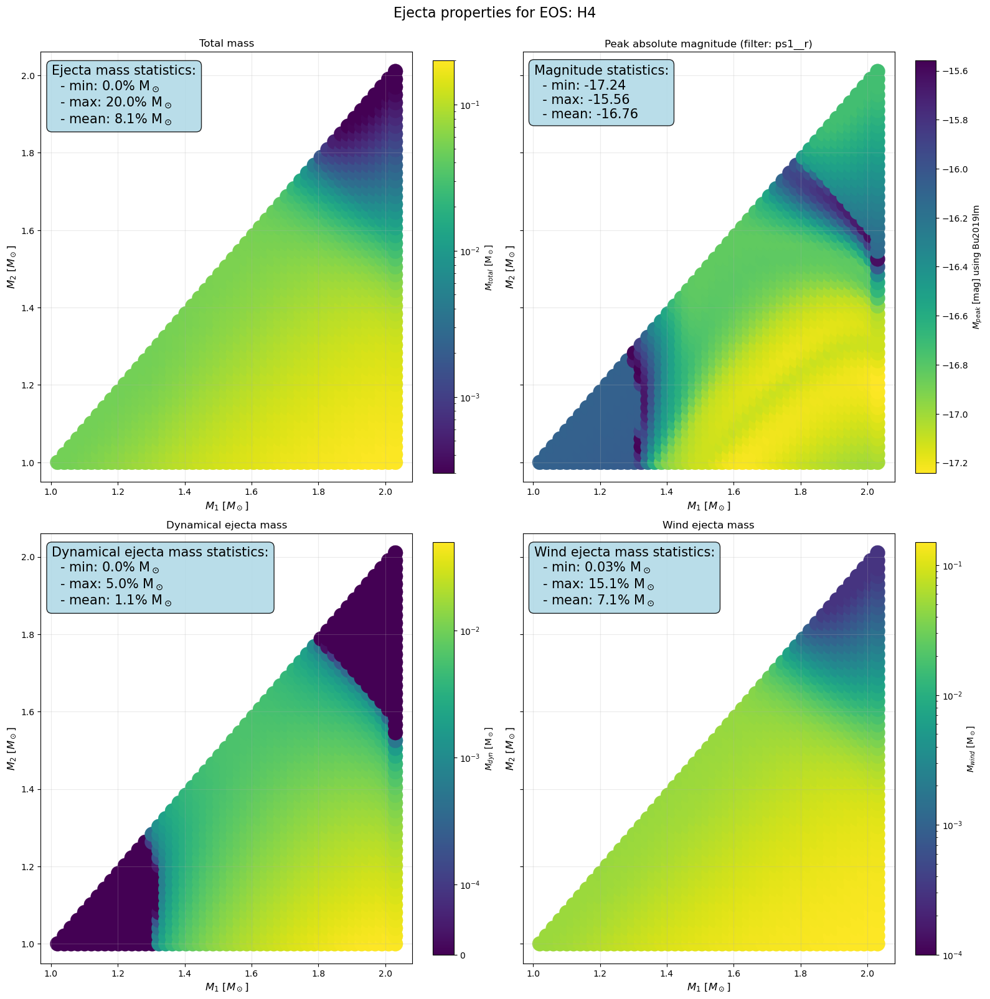

In [12]:
# Create a 1st ejecta plot
figu, axis, dic = ejecta_plot_v3(
    eos_name='H4',
    model_name='Bu2019lm',
    title='Ejecta properties for EOS: H4',
    model_param={"luminosity_distance": 40.0, "KNphi": 30.0, "KNtheta": 30.0},
    filters=['ps1__r'],
    plot=True,
    get_fig=True
)

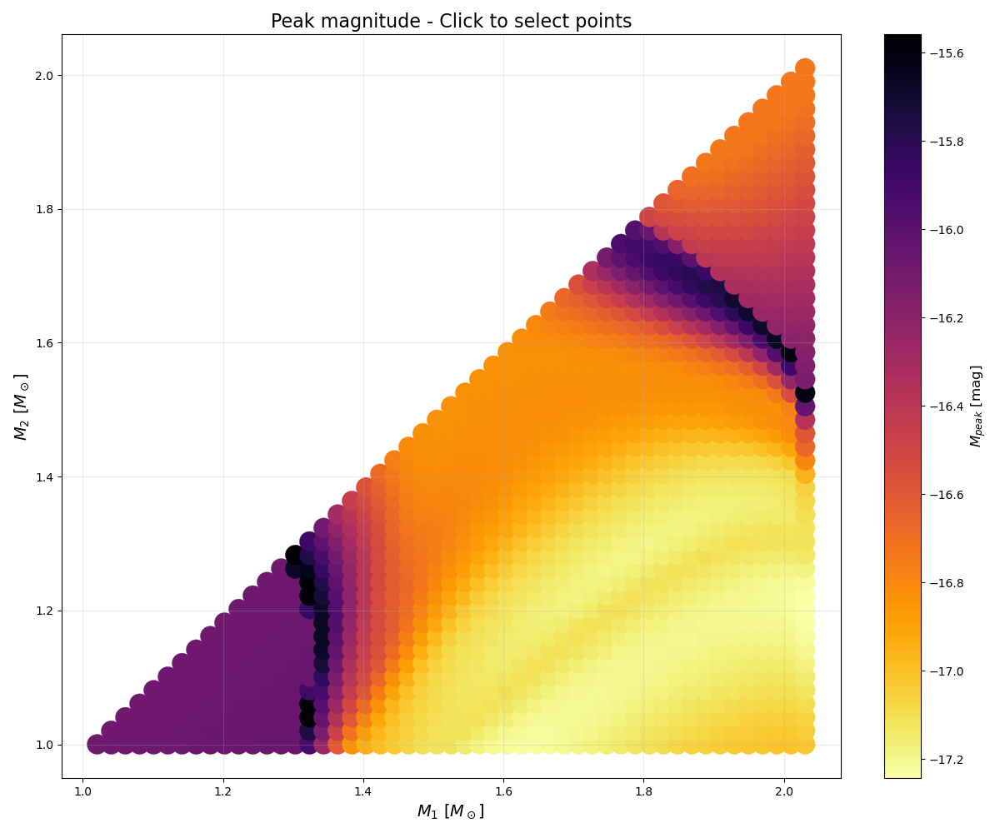

In [15]:
# select points interactively
selected_indices = get_indices(dic)

Selected point (index 938):
  M1: 1.869 M☉
  M2: 1.707 M☉
  Magnitude: -15.80
  M_dyn: 0.0009 M☉
  M_wind: 0.0056 M☉

Selected point (index 980):
  M1: 1.889 M☉
  M2: 1.687 M☉
  Magnitude: -15.78
  M_dyn: 0.0011 M☉
  M_wind: 0.0072 M☉

Loaded filter ps1__r
Loaded filter ps1__i
Loaded filter ps1__g
⚠ No file found for these parameters:
  mejdyn=0.0008853418685767947, mejwind=0.0016879254017593583, phi=30.0, theta=30.0, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi30_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 30.0, 'theta': 25.84, 'dMpc': 0.0}
⚠ No file found for these parameters:
  mejdyn=0.001073326930172435, mejwind=0.002147675590172481, phi=30.0, theta=30.0, dMpc=0
Using closest match: nph1.0e+06_mejdyn0.001_mejwind0.010_phi30_theta25.84_dMpc0.dat with params {'nph': '1.0e+06', 'mejdyn': 0.001, 'mejwind': 0.01, 'phi': 30.0, 'theta': 25.84, 'dMpc': 0.0}


/tmp/ipykernel_1057/3345560947.py:197: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


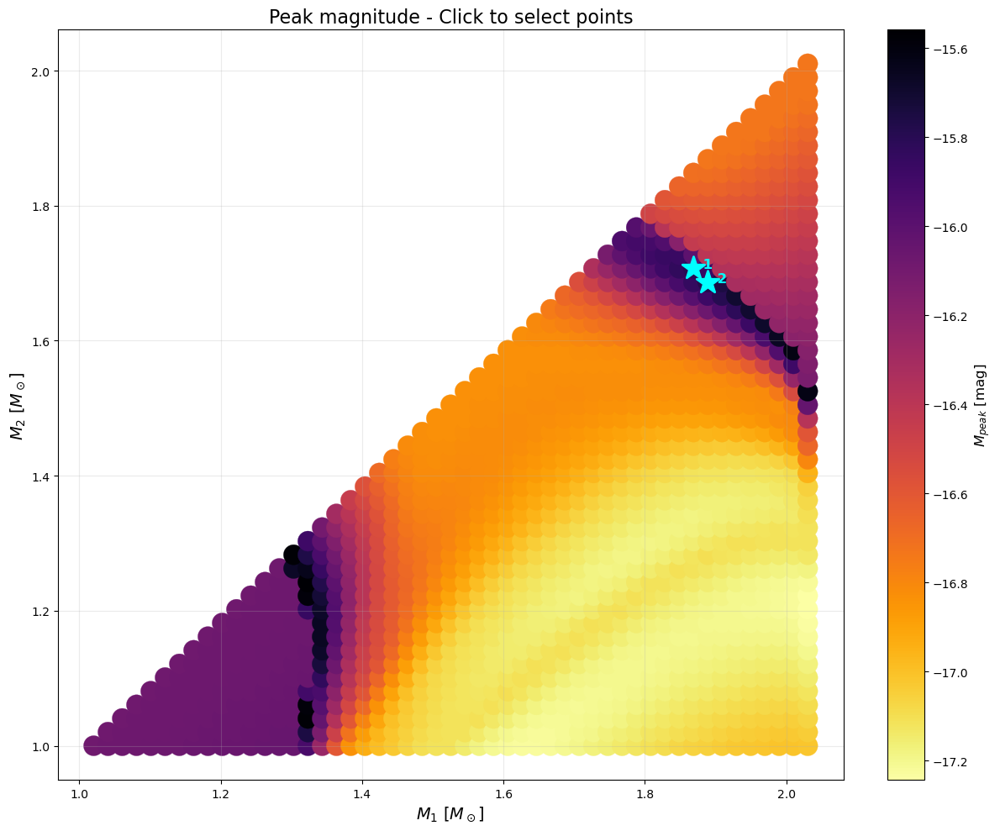

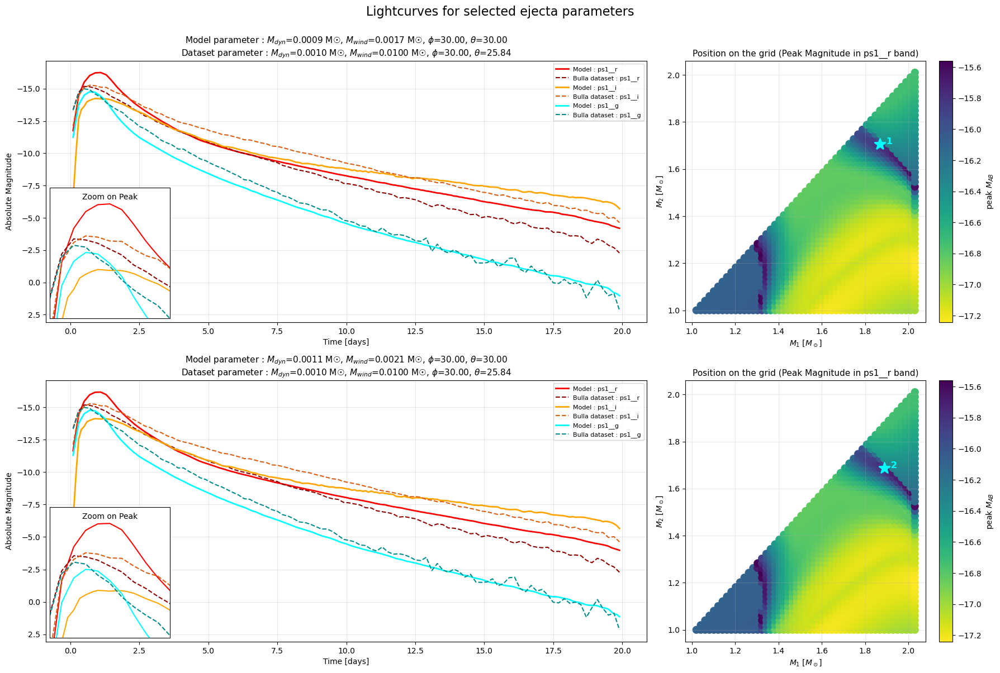

In [16]:
# Plot the lightcurves for the selected points
plot_lc_for_indices_v3(
    selected_indices,
    dic,
    title='Lightcurves for selected ejecta parameters',
    filters_band=['ps1__r', 'ps1__i', 'ps1__g'],
    model_name='Bu2019lm'
)

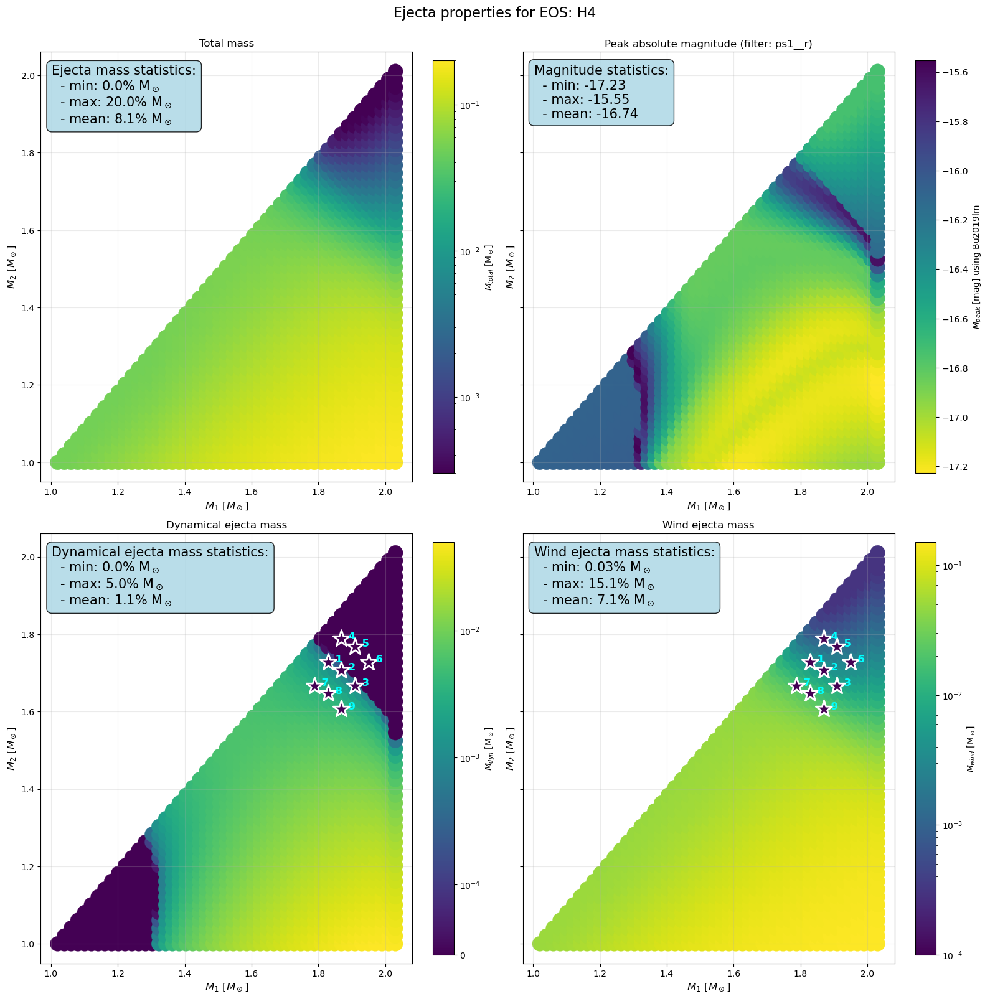

In [ ]:
%matplotlib inline
from IPython.display import display
# Try to place the selected points on the ejecta plot
for idx in selected_indices:
    m1 = dic['pair_array'][idx, 0]
    m2 = dic['pair_array'][idx, 1]
    ax[1,0].scatter(m1, m2, c=dic['fit_masses'][idx], s=400, marker='*', linewidths=2, zorder=10, edgecolors='white')
    ax[1,0].text(m1, m2, f'  {selected_indices.index(idx)+1}', fontsize=12, fontweight='bold', color='white', zorder=11)
    ax[1,1].scatter(m1, m2, c=dic['wind_linear'][idx], s=400, marker='*', linewidths=2, zorder=10, edgecolors='white')
    ax[1,1].text(m1, m2, f'  {selected_indices.index(idx)+1}', fontsize=12, fontweight='bold', color='white', zorder=11)
fig.canvas.draw()
plt.show()
display(fig)

# BIG problem
The ejecta properties for the selected points does not match the actual ejecta properties for said point. 

In [ ]:
# Trying to solve the issue of mismatch
print(dic['fit_masses'][selected_indices])
print(dic['wind_linear'][selected_indices])

[0.00119324 0.00088534 0.00128208 0.         0.         0.
 0.0034825  0.0035068  0.00427544]
[0.00530919 0.00562642 0.00904782 0.00110981 0.00149575 0.00289327
 0.02117245 0.02114077 0.0277805 ]


Well, actually it was right. I just need to fix the issue with the color by applying the same Norm as in the function.

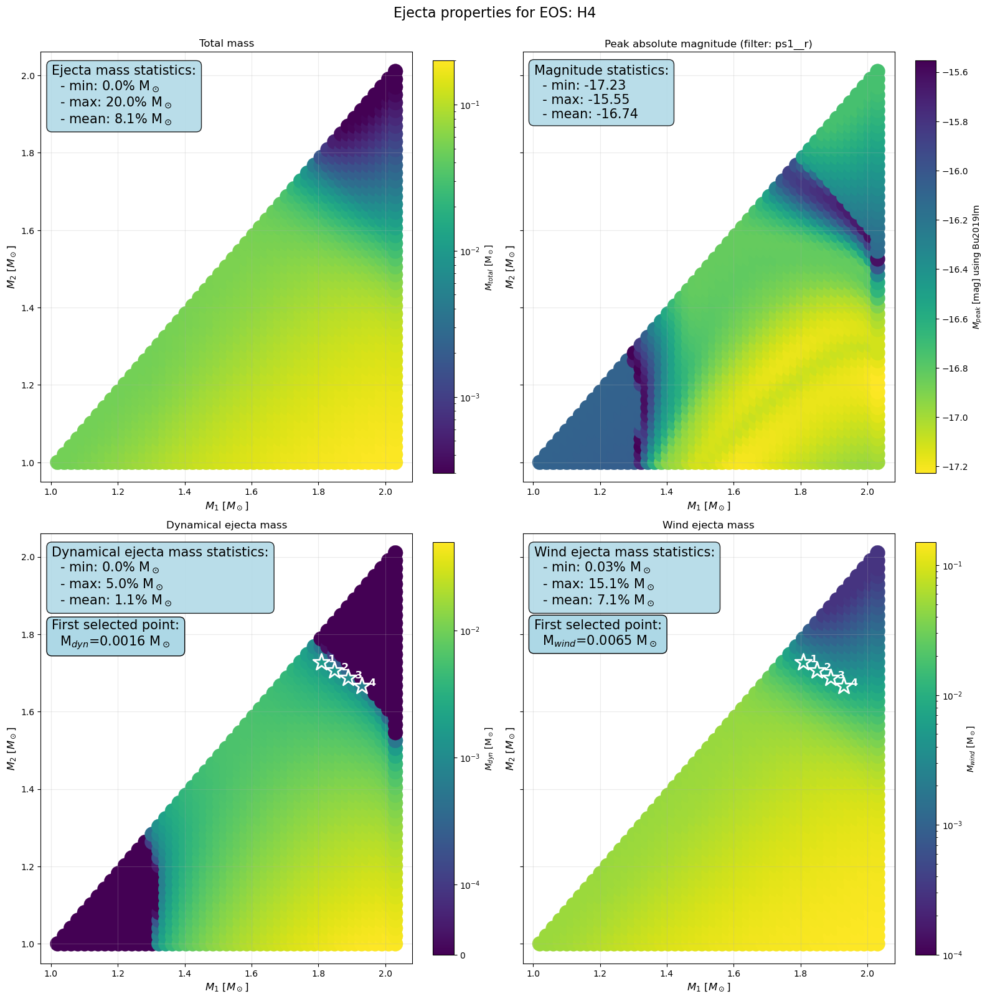

In [ ]:
import matplotlib.colors as colors

norm_dyn = colors.SymLogNorm(vmin=0, vmax=dic['fit_masses'].max(), linthresh=1e-4, linscale=0.5) # same as in ejecta_plot_v3
norm_wind = colors.LogNorm(vmin=10e-5, vmax=dic['wind_linear'].max())

# Try to place the selected points on the ejecta plot
for idx in selected_indices:
    m1 = dic['pair_array'][idx, 0]
    m2 = dic['pair_array'][idx, 1]
    axis[1,0].scatter(m1, m2, c=dic['fit_masses'][idx], s=400, marker='*', linewidths=2, zorder=10, edgecolors='white', norm=norm_dyn)
    axis[1,0].text(m1, m2, f'  {selected_indices.index(idx)+1}', fontsize=12, fontweight='bold', color='white', zorder=11)
    axis[1,1].scatter(m1, m2, c=dic['wind_linear'][idx], s=400, marker='*', linewidths=2, zorder=10, edgecolors='white', norm=norm_wind)
    axis[1,1].text(m1, m2, f'  {selected_indices.index(idx)+1}', fontsize=12, fontweight='bold', color='white', zorder=11)
    if idx == selected_indices[0]:  # only for the first selected point
        star1_stat_dyn = (f"First selected point:\n"
                  f"  M$_{{dyn}}$={dic['fit_masses'][idx]:.4f} M$_\\odot$")
        axis[1,0].text(0.03, 0.8, star1_stat_dyn, transform=axis[1,0].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=1, edgecolor='0'))
        star1_stat_wind = (f"First selected point:\n"
                   f"  M$_{{wind}}$={dic['wind_linear'][idx]:.4f} M$_\\odot$")
        axis[1,1].text(0.03, 0.8, star1_stat_wind, transform=axis[1,1].transAxes,
                    fontsize=15, va='top', ha='left',
                    bbox=dict(boxstyle='round,pad=0.4', facecolor='lightblue', alpha=1, edgecolor='0'))
figu.canvas.draw()
plt.show()
display(figu)

### Re-do the scatter plot m_dyn/wind for sdss filters

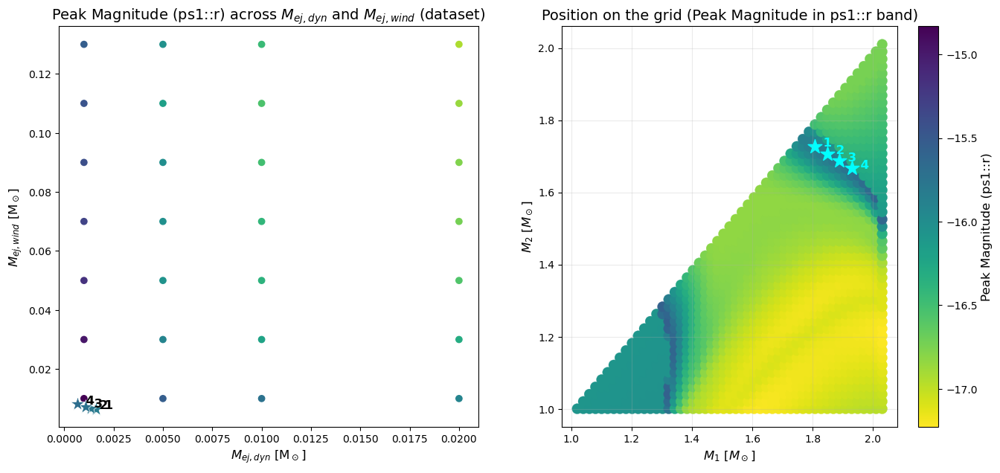

In [ ]:
# Scatter plot of peak magnitude (mdyn vs mwind)
mejdyn_values = bulla_dataset.param_ranges['mejdyn']['unique']
mejwind_values = bulla_dataset.param_ranges['mejwind']['unique']
peak_magnitudes = np.full((len(mejdyn_values), len(mejwind_values)), np.nan)
for i, mejdyn in enumerate(mejdyn_values):
    for j, mejwind in enumerate(mejwind_values):
        file_info = bulla_dataset.get_file(mejdyn=mejdyn, mejwind=mejwind, phi=30, theta=benchmark_file['params']['theta'], dMpc=0, load_data=True)
        if file_info:
            if file_info['data'] is None:
                file_info['data'] = np.loadtxt(file_info['filepath'])
                file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
            data = file_info['data']
            if 'ps1::r' in file_info['filters']:
                filter_idx = file_info['filters'].index('ps1::r')
                magnitudes = data[:, filter_idx + 1]
                peak_magnitudes[i, j] = np.min(magnitudes)

# Compact the arrays for plotting with meshgrid
X, Y = np.meshgrid(mejdyn_values, mejwind_values)
Z = peak_magnitudes.T
norm2 = plt.Normalize(vmin=dic['magnitude'].min(), vmax=Z.max())

# Plot
fig, axx = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))
sc = axx[0].scatter(
    X,
    Y,
    c=Z,
    cmap='viridis_r',
    #shading='auto',
    norm=norm2
)
axx[0].set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
axx[0].set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
axx[0].set_title('Peak Magnitude (ps1::r) across $M_{ej,dyn}$ and $M_{ej,wind}$ (dataset)', fontsize=14)


# add the faulty point

mags = dic['magnitude']
scc = axx[1].scatter(dic['pair_array'][:, 0], dic['pair_array'][:, 1], c=mags, cmap='viridis_r',
                            s=100, edgecolors=None, linewidths=0.2, norm=norm2)

for i, idx in enumerate(selected_indices):
    rgba = plt.cm.viridis_r(norm2(float(dic['magnitude'][idx])))
    axx[0].scatter(dic['fit_masses'][idx], dic['wind_linear'][idx], color=rgba, s=200, label='Selected Point', marker='*', edgecolors='white', linewidths=0.5)
    axx[0].text(dic['fit_masses'][idx], dic['wind_linear'][idx], f'  {i+1}', fontsize=12, fontweight='bold', color='black')

    # Plot position on grid mass
    axx[1].scatter(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], color='cyan', s=200, label='Selected Point', marker='*')
    axx[1].text(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
axx[1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
axx[1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
axx[1].set_title('Position on the grid (Peak Magnitude in ps1::r band)', fontsize=14)
axx[1].grid(True, alpha=0.25)
cbar = plt.colorbar(scc, ax=axx[1])
cbar.set_label('Peak Magnitude (ps1::r)', fontsize=12)

plt.show()

## Trying to do another version of the plot selected indices

Loaded filter ps1__r
Loaded filter ps1__i


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Loaded filter ps1__g


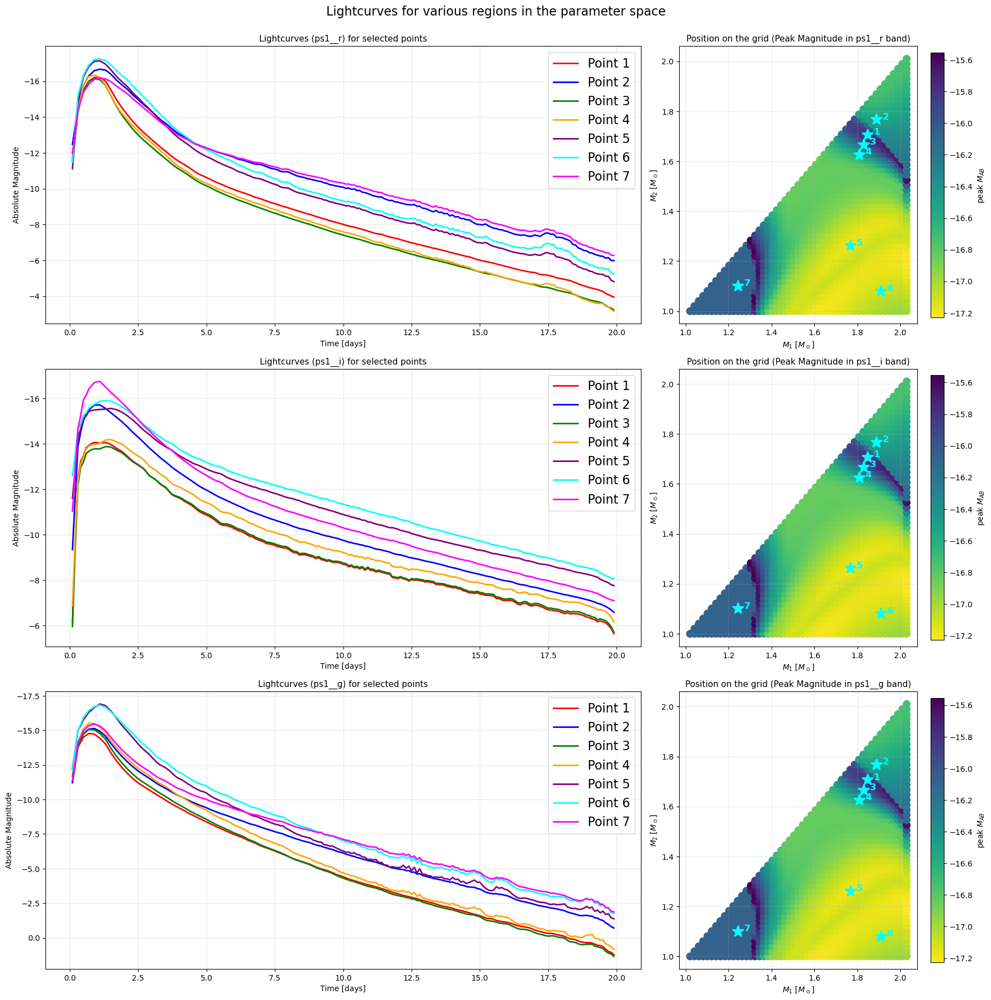

In [ ]:
filters = ['ps1__r', 'ps1__i', 'ps1__g']
fig, axes = plt.subplots(len(filters), 2, figsize=(18, 6*len(filters)), gridspec_kw={'width_ratios': [2.25, 1]})
norm = plt.Normalize(vmin=dic['magnitude'].min(), vmax=dic['magnitude'].max())

# setup model
svd_model = SVDLightCurveModel(
    model='Bu2019lm',
    sample_times=np.arange(0.1, 20.0, 0.1),
    svd_path='/home/liteul/memoir_code/NMMA/svdmodels',
    mag_ncoeff=10,
    lbol_ncoeff=10,
    filters=['ps1__r', 'ps1__i', 'ps1__g']
)
model_param = dic['model_param']
colors = ['red', 'blue', 'green', 'orange', 'purple', 'cyan', 'magenta', 'black', 'grey']

for i, filter_name in enumerate(filters):
    ax = axes[i,0]
    for idx in all_zones:
        if dic['fit_masses'][idx] > 0:
            log_10dyn = np.log10(dic['fit_masses'][idx])
        else:
            log_10dyn = -5 
        log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'][idx])
        model_param.update({
                "log10_mej_dyn": log_10dyn,             
                "log10_mej_wind": log_10wind,   
            })
        _, mag_svd = svd_model.generate_lightcurve(np.arange(0.1, 20.0, 0.1), model_param)
        ax.plot(np.arange(0.1, 20.0, 0.1), mag_svd[filter_name], label=f'Point {all_zones.index(idx)+1}', linewidth=2, color=colors[all_zones.index(idx)%len(colors)])
    ax.invert_yaxis()
    ax.set_xlabel('Time [days]', fontsize=10)
    ax.set_ylabel('Absolute Magnitude', fontsize=10)
    ax.set_title(f'Lightcurves ({filter_name}) for selected points', fontsize=11)
    ax.legend(fontsize=16)
    ax.grid(True, alpha=0.3)
    # Show position on the grid
    ax2 = axes[i,1]
    sc = ax2.scatter(dic['pair_array'][:, 0], dic['pair_array'][:, 1], c=dic['magnitude'], cmap='viridis_r',
                                s=100, edgecolors=None, linewidths=0.2, norm=norm)
    cbar = fig.colorbar(sc, ax=ax2, orientation='vertical', fraction=0.05)
    cbar.set_label('peak $M_{AB}$', fontsize=10)
    for idx in all_zones:
        ax2.scatter(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], 
                        c='cyan', s=200, marker='*', linewidths=2,
                        zorder=10)
        ax2.text(dic['pair_array'][idx, 0], dic['pair_array'][idx, 1], f'  {all_zones.index(idx)+1}', fontsize=12, fontweight='bold', color='cyan')
    ax2.set_xlabel('$M_1$ [$M_\\odot$]', fontsize=10)
    ax2.set_ylabel('$M_2$ [$M_\\odot$]', fontsize=10)
    ax2.set_title(f'Position on the grid (Peak Magnitude in {filter_name} band)', fontsize=11)
    ax2.grid(True, alpha=0.25)
fig.suptitle('Lightcurves for various regions in the parameter space', fontsize=16, y=1.0001)
plt.tight_layout()
plt.show()

In [ ]:
print("Faulty zones:", faulty_zone)
print("All zones: ", all_zones)

Faulty zones: [816, 896, 980, 1068]
All zones:  [896, 984, 853, 811, 716, 994, 71]


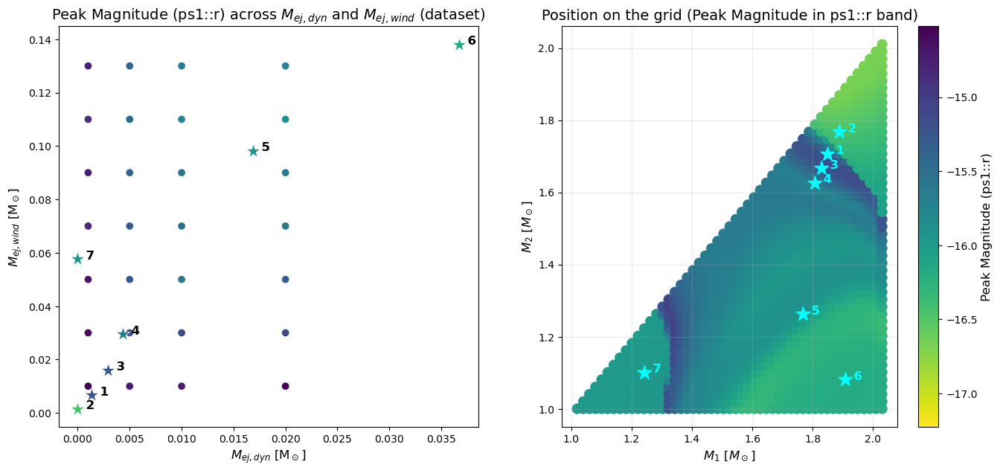

In [ ]:
# Scatter plot of peak magnitude (mdyn vs mwind)
mejdyn_values = bulla_dataset.param_ranges['mejdyn']['unique']
mejwind_values = bulla_dataset.param_ranges['mejwind']['unique']
peak_magnitudes = np.full((len(mejdyn_values), len(mejwind_values)), np.nan)
for i, mejdyn in enumerate(mejdyn_values):
    for j, mejwind in enumerate(mejwind_values):
        file_info = bulla_dataset.get_file(mejdyn=mejdyn, mejwind=mejwind, phi=60, theta=benchmark_file['params']['theta'], dMpc=0, load_data=True)
        if file_info:
            if file_info['data'] is None:
                file_info['data'] = np.loadtxt(file_info['filepath'])
                file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
            data = file_info['data']
            if 'ps1::r' in file_info['filters']:
                filter_idx = file_info['filters'].index('ps1::r')
                magnitudes = data[:, filter_idx + 1]
                peak_magnitudes[i, j] = np.min(magnitudes)

# Compact the arrays for plotting with meshgrid
X, Y = np.meshgrid(mejdyn_values, mejwind_values)
Z = peak_magnitudes.T
norm2 = plt.Normalize(vmin=dic['magnitude'].min(), vmax=Z.max())

# Plot
fig, axx = plt.subplots(ncols=2, nrows=1, figsize=(16, 7))
sc = axx[0].scatter(
    X,
    Y,
    c=Z,
    cmap='viridis_r',
    #shading='auto',
    norm=norm2
)
axx[0].set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
axx[0].set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
axx[0].set_title('Peak Magnitude (ps1::r) across $M_{ej,dyn}$ and $M_{ej,wind}$ (dataset)', fontsize=14)


# add the faulty point

mags = dic2['magnitude']
scc = axx[1].scatter(dic2['pair_array'][:, 0], dic2['pair_array'][:, 1], c=mags, cmap='viridis_r',
                            s=100, edgecolors=None, linewidths=0.2, norm=norm2)

for i, idx in enumerate(all_zones):
    rgba = plt.cm.viridis_r(norm2(float(dic2['magnitude'][idx])))
    axx[0].scatter(dic2['fit_masses'][idx], dic2['wind_linear'][idx], color=rgba, s=200, label='Selected Point', marker='*', edgecolors='white', linewidths=0.5)
    axx[0].text(dic2['fit_masses'][idx], dic2['wind_linear'][idx], f'  {i+1}', fontsize=12, fontweight='bold', color='black')

    # Plot position on grid mass
    axx[1].scatter(dic2['pair_array'][idx, 0], dic2['pair_array'][idx, 1], color='cyan', s=200, label='Selected Point', marker='*')
    axx[1].text(dic2['pair_array'][idx, 0], dic2['pair_array'][idx, 1], f'  {i+1}', fontsize=12, fontweight='bold', color='cyan')
axx[1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
axx[1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
axx[1].set_title('Position on the grid (Peak Magnitude in ps1::r band)', fontsize=14)
axx[1].grid(True, alpha=0.25)
cbar = plt.colorbar(scc, ax=axx[1])
cbar.set_label('Peak Magnitude (ps1::r)', fontsize=12)

plt.show()

After having done the scatter for phi=30 and phi=60 I am quite intrigued because here the faulty zone doesn't seem to evolve much which is odd compared to the time I compared the impact of phi for the besselr filter and where the value of phi greatly influenced the faulty zone, here it is more the sane magnitude that is impacted.

Processing EOS: H4
Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


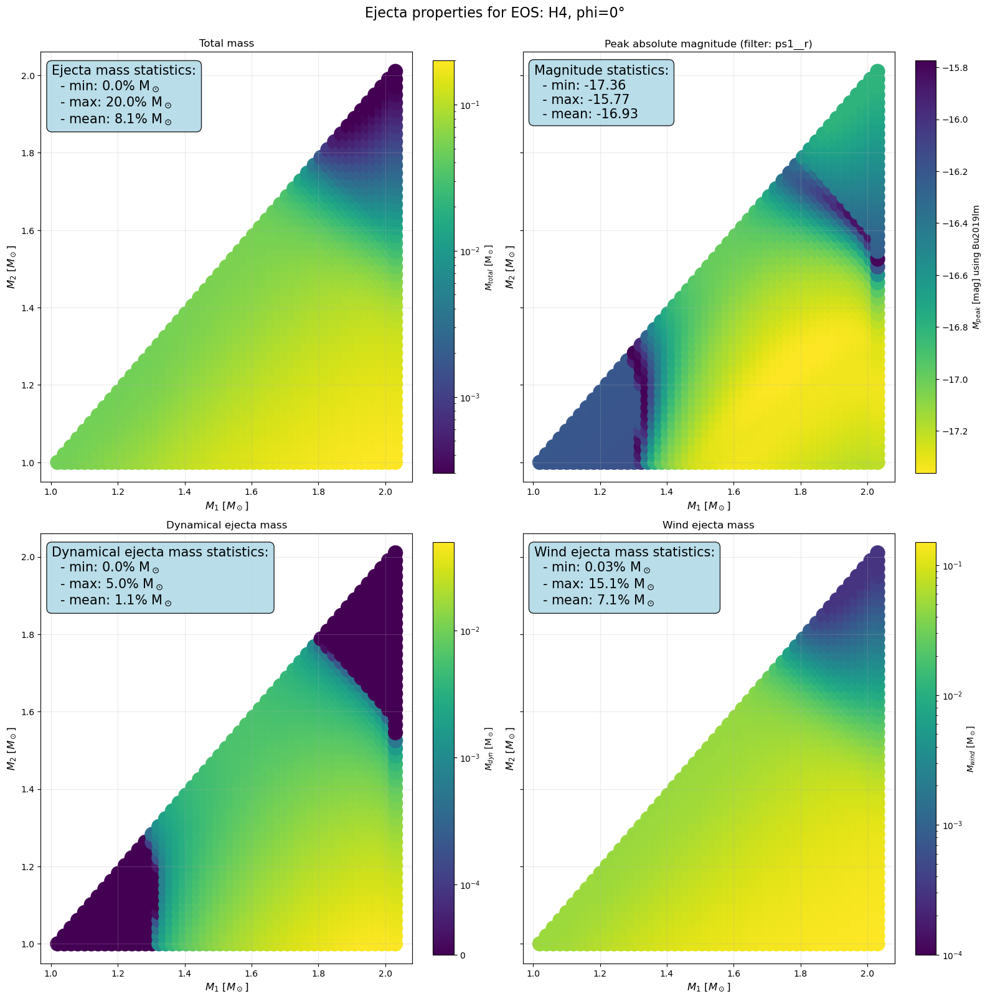

Processing EOS: H4
Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


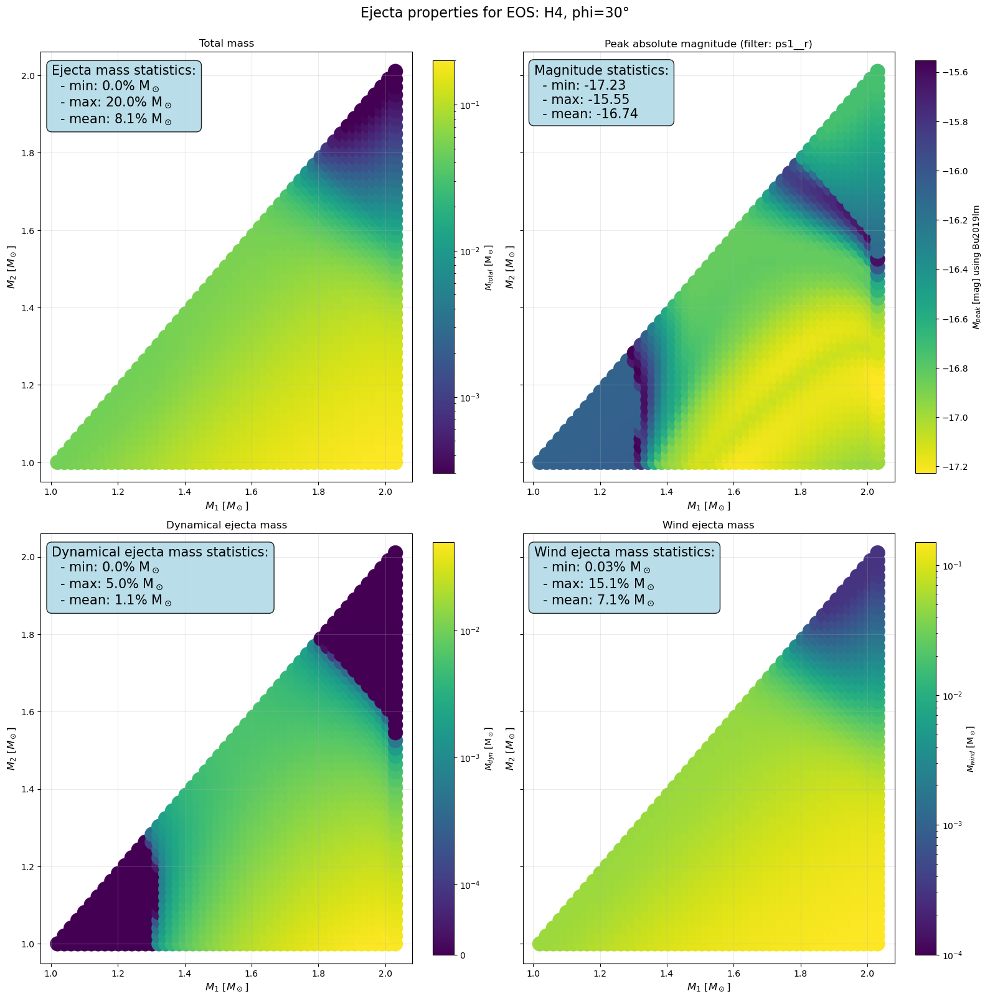

Processing EOS: H4
Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


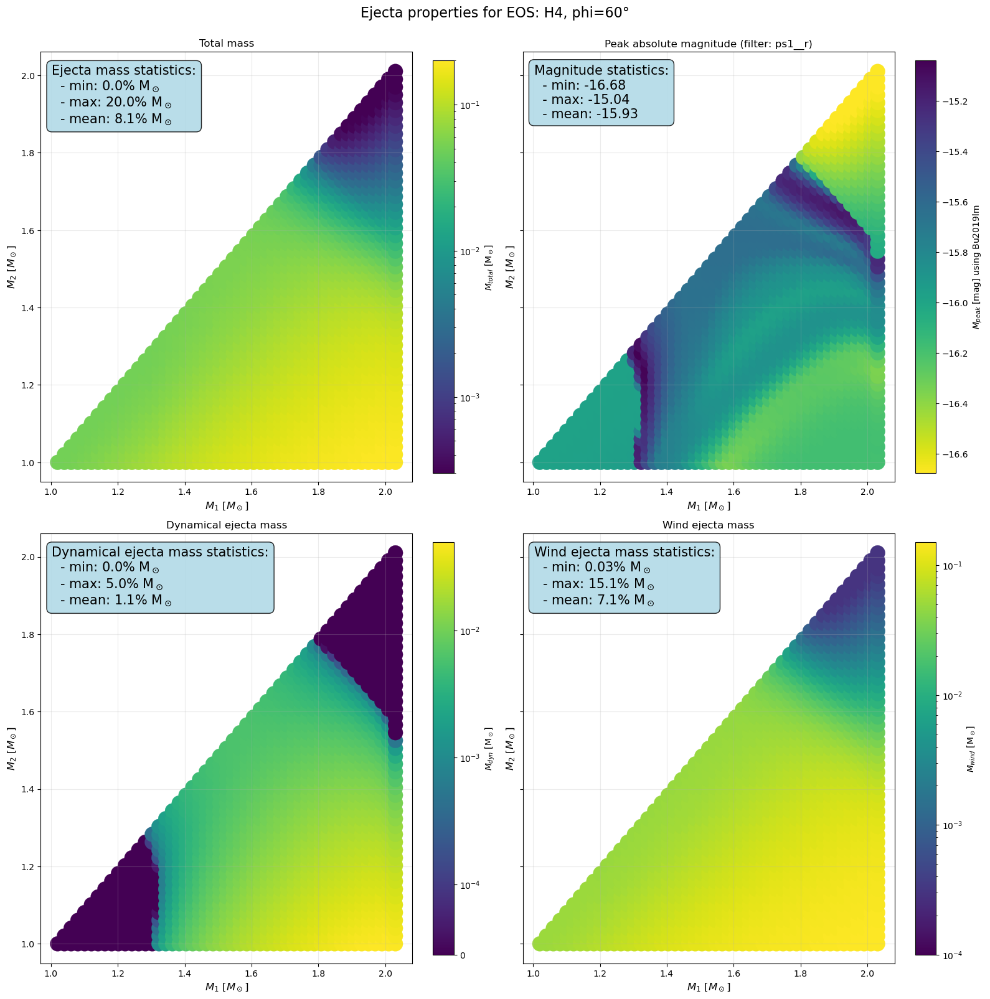

Processing EOS: H4
Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


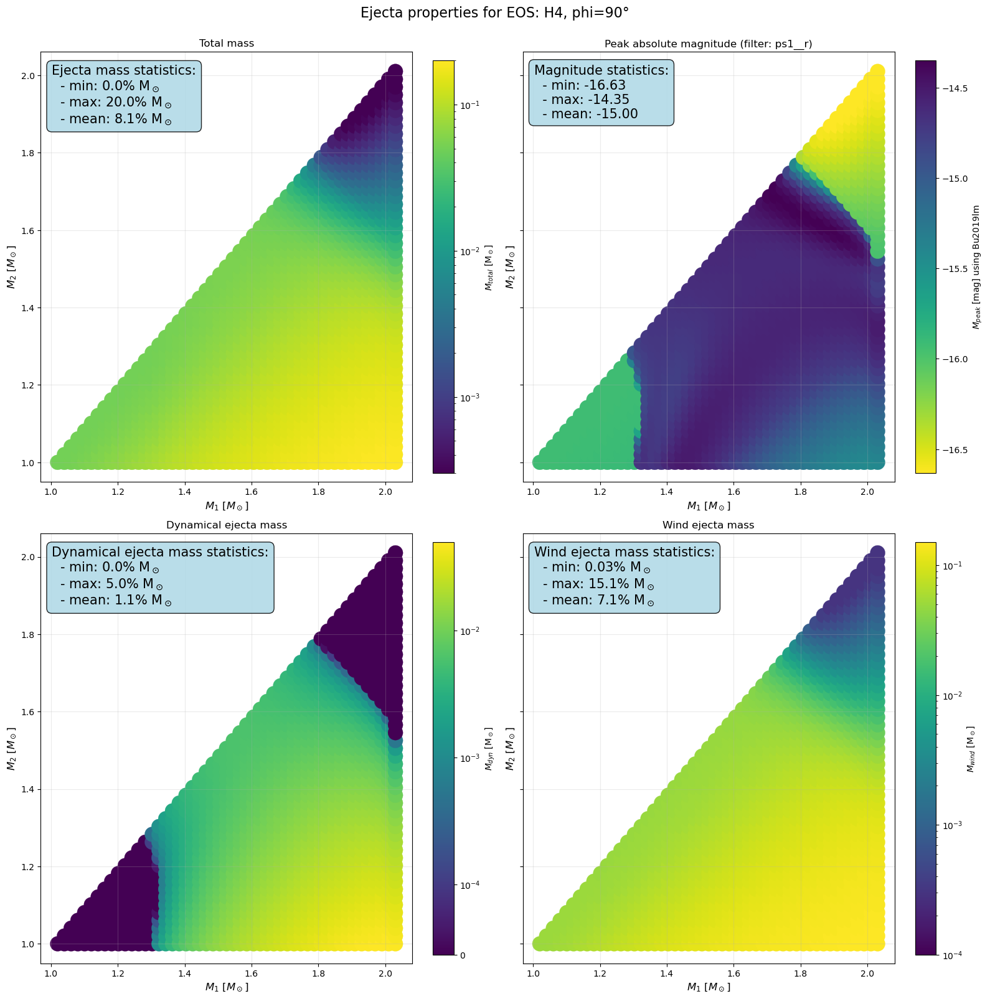

In [ ]:
# Plot diff phi for ps1__r
for phi in [0, 30, 60, 90]:
    ejecta_plot_v3(
        eos_name='H4',
        model_name='Bu2019lm',
        title=f'Ejecta properties for EOS: H4, phi={phi}°',
        model_param={"luminosity_distance": 40.0, "KNphi": phi, "KNtheta": 30.0},
        filters=['ps1__r'],
        plot=True,
        get_fig=False
    )

# Influence de l'EOS

Processing EOS: APR4_EPP
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


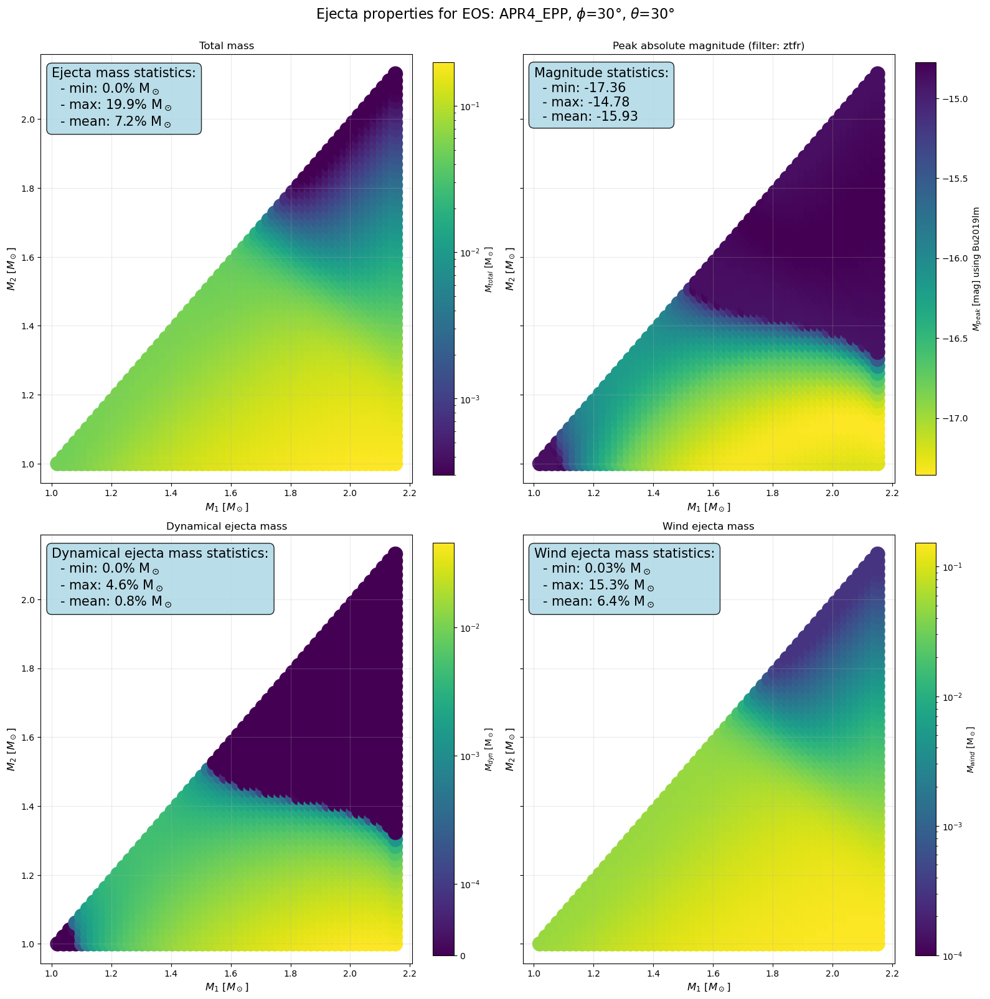

Processing EOS: BHF_BBB2
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


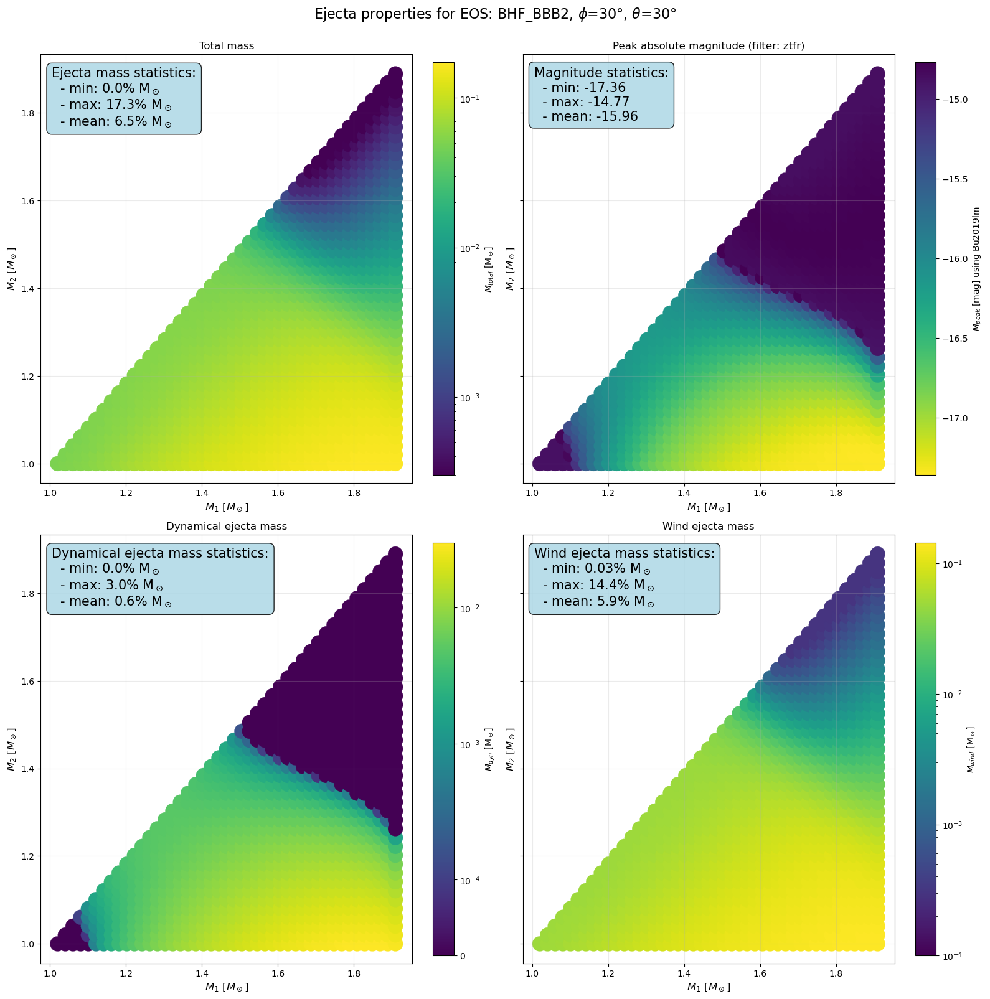

Processing EOS: H4
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


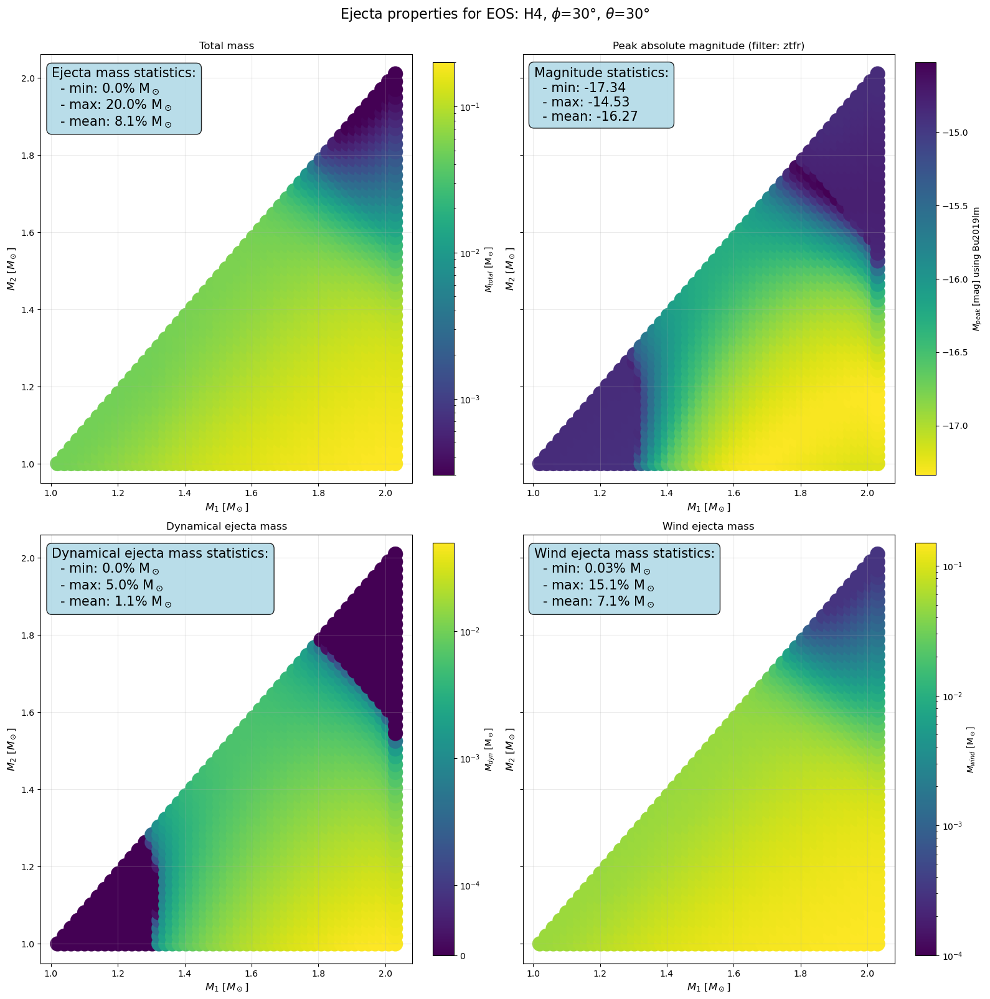

Processing EOS: HQC18
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


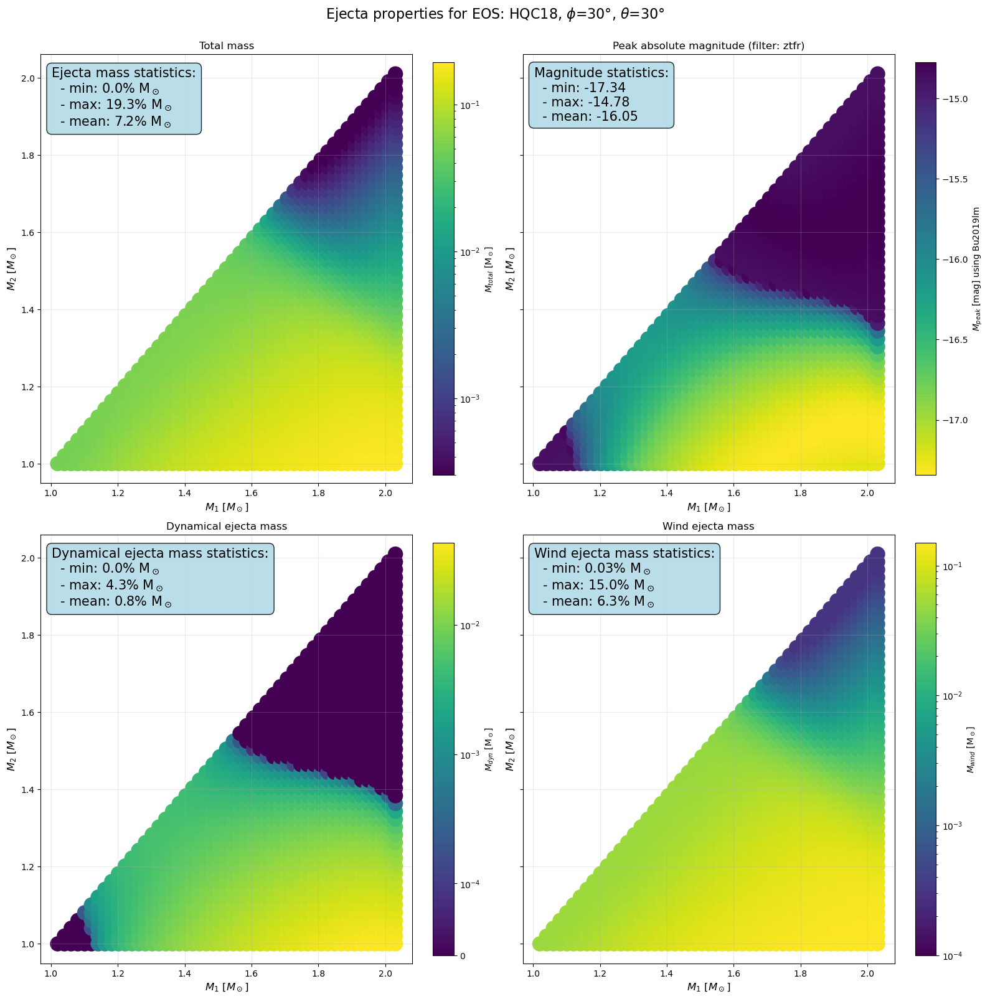

Processing EOS: KDE0V
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


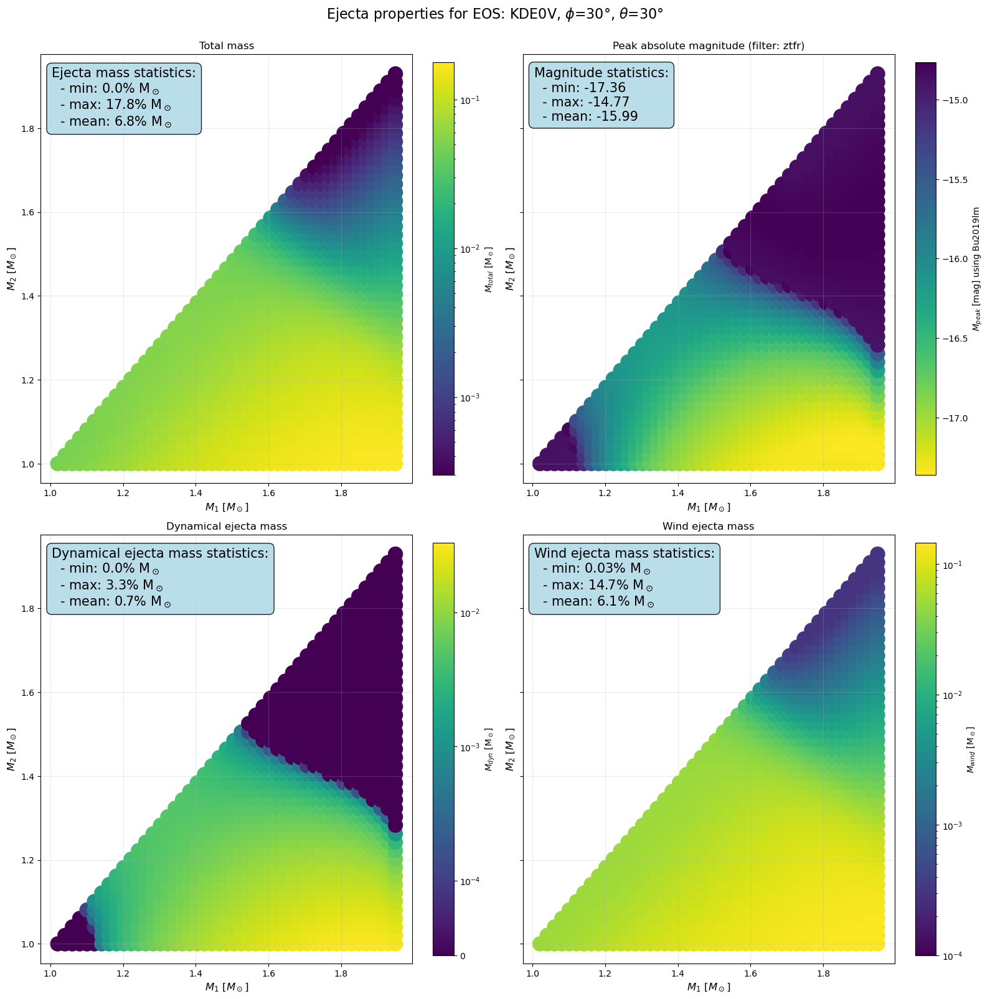

Processing EOS: KDE0V1
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


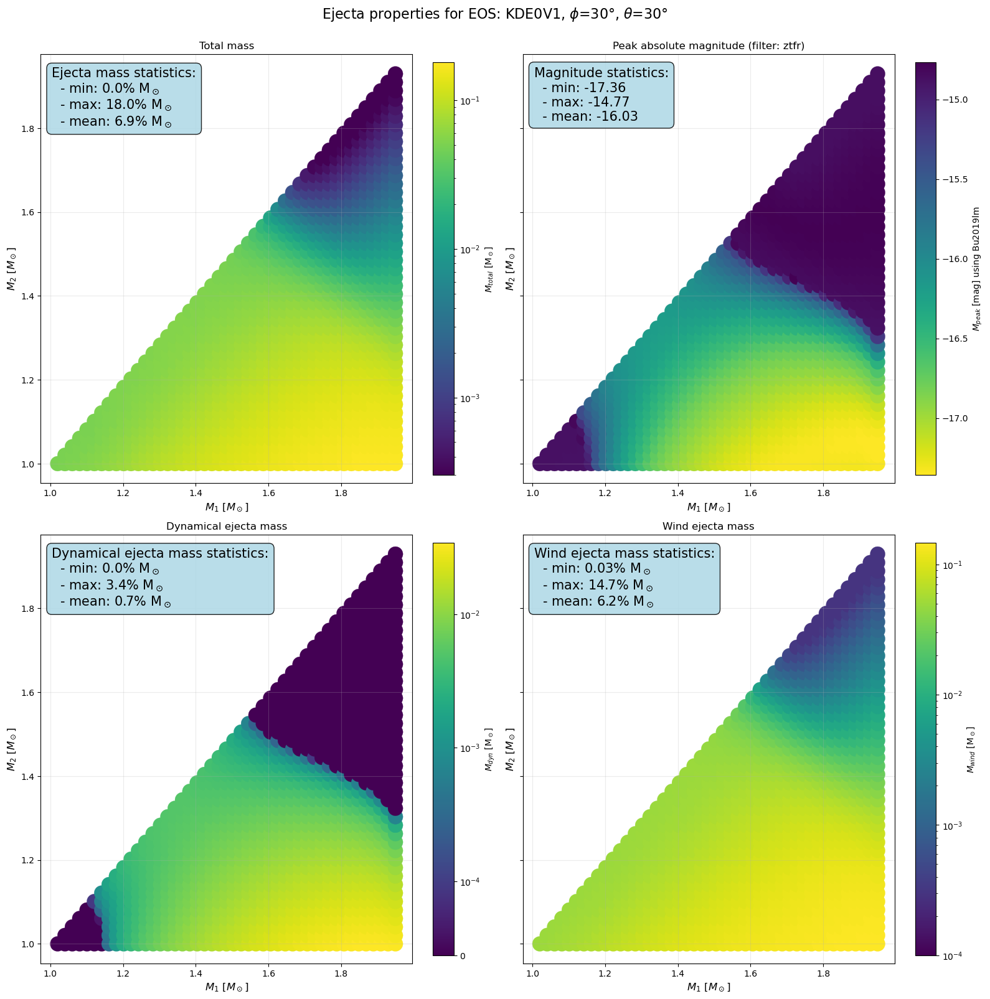

Processing EOS: MPA1
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


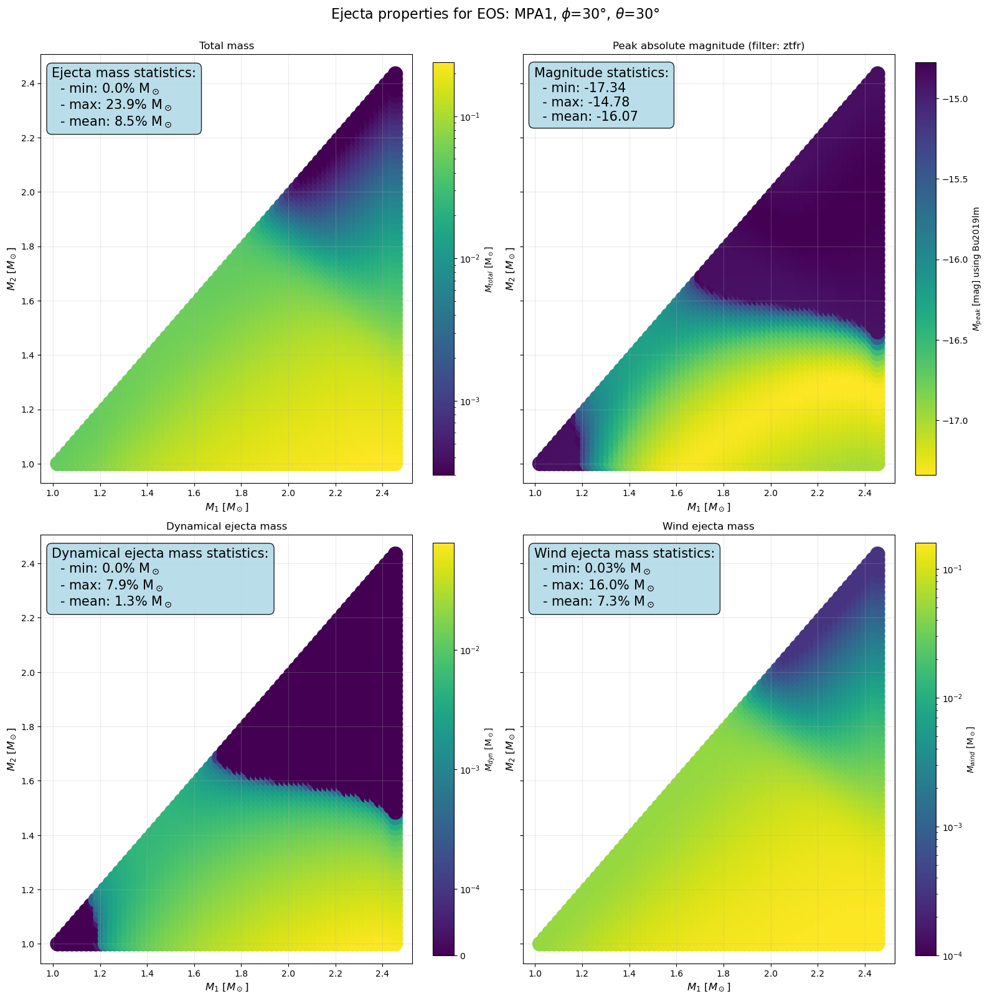

Processing EOS: MS1B_PP
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


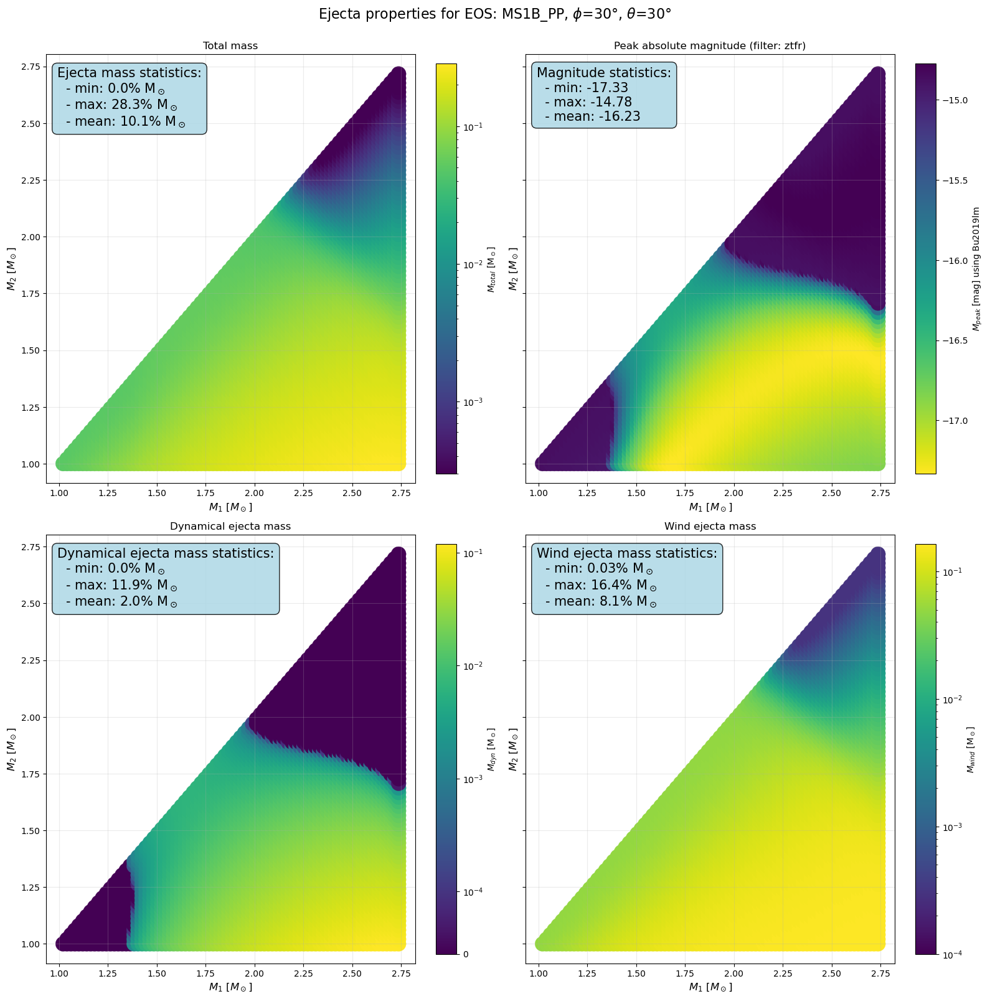

Processing EOS: MS1_PP
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


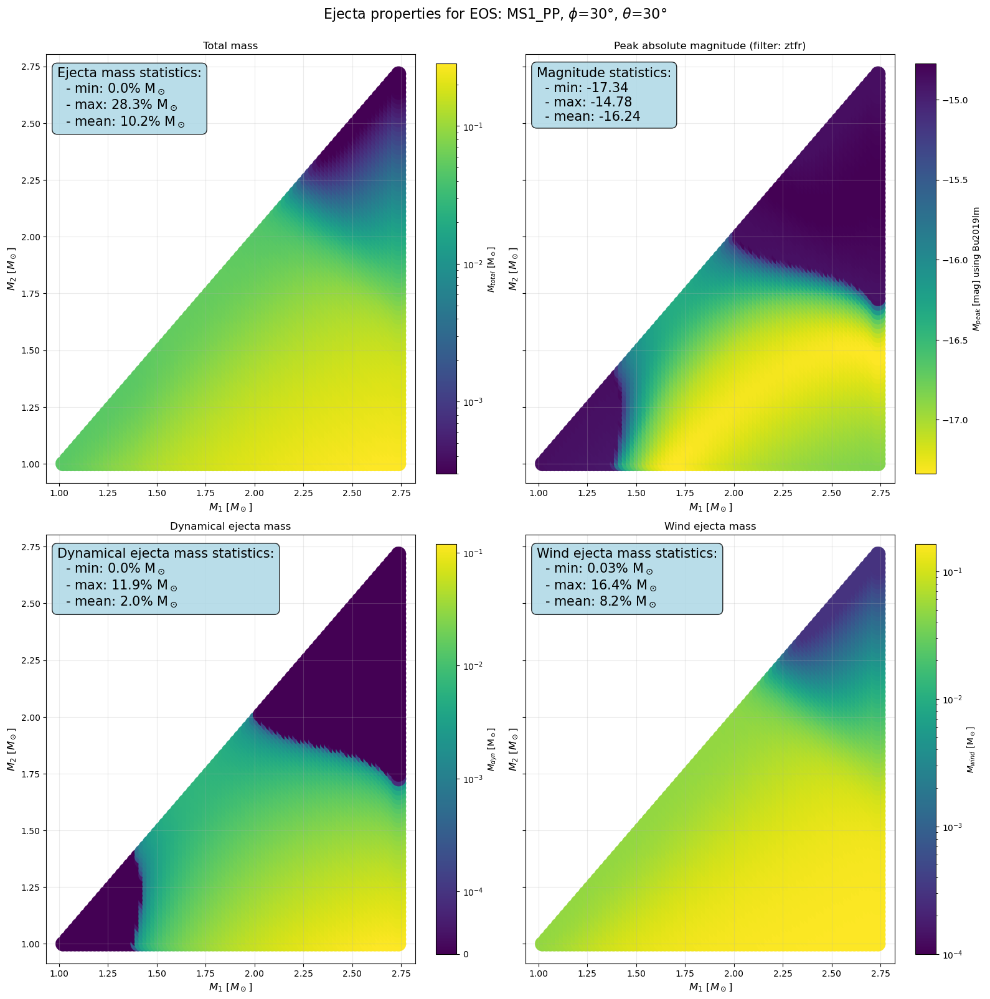

Processing EOS: RS
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


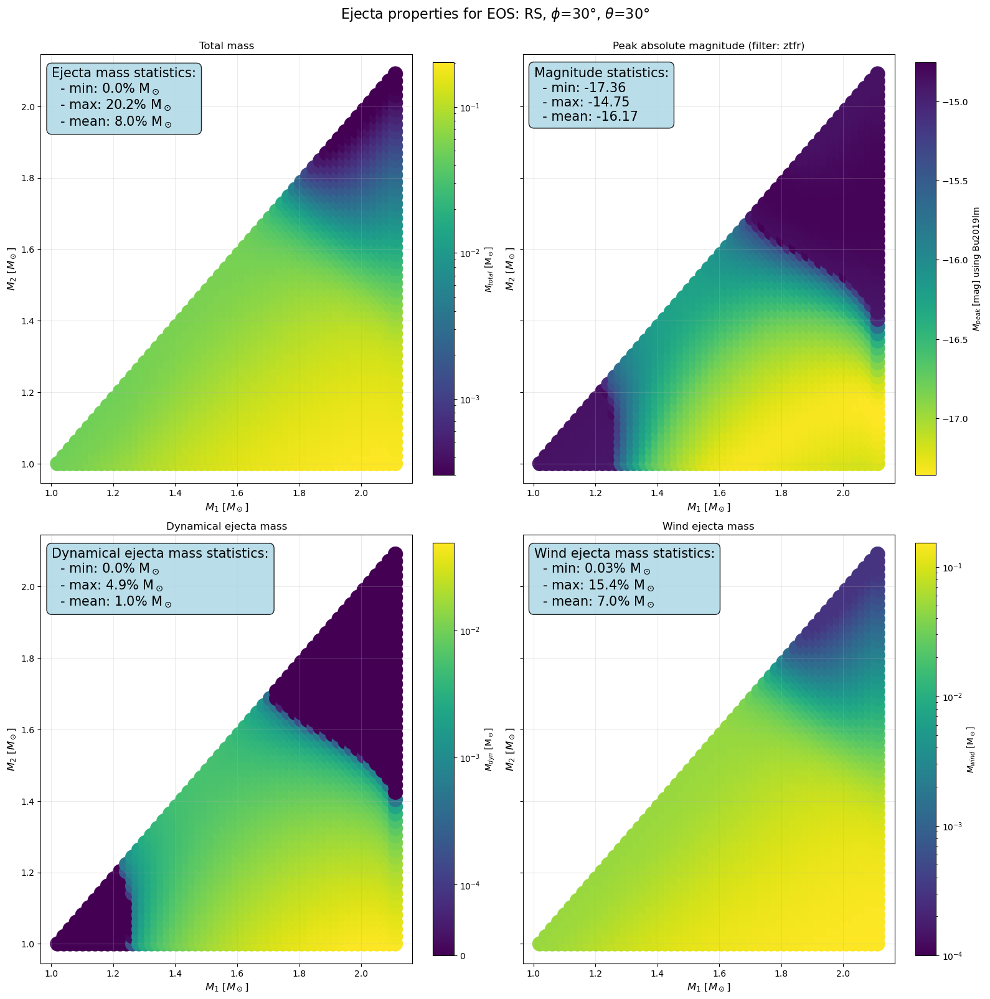

Processing EOS: SK255
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


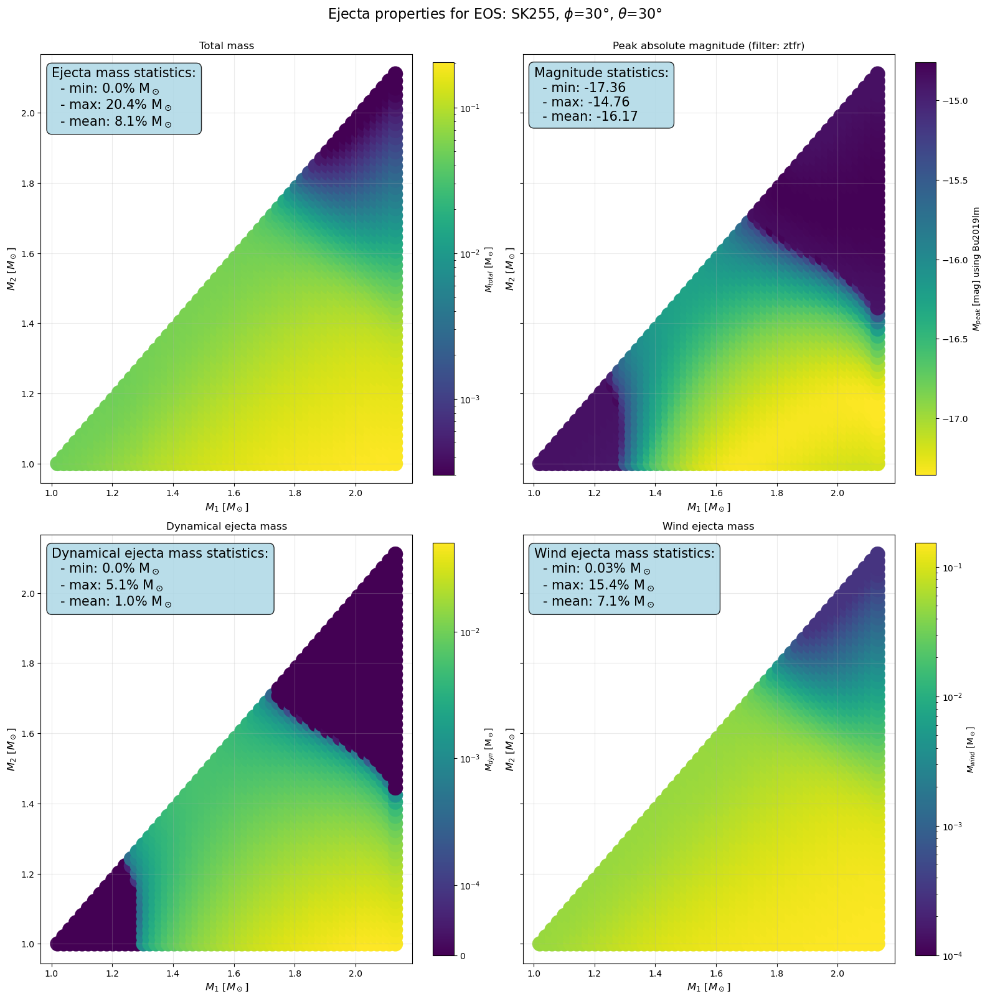

Processing EOS: SK272
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


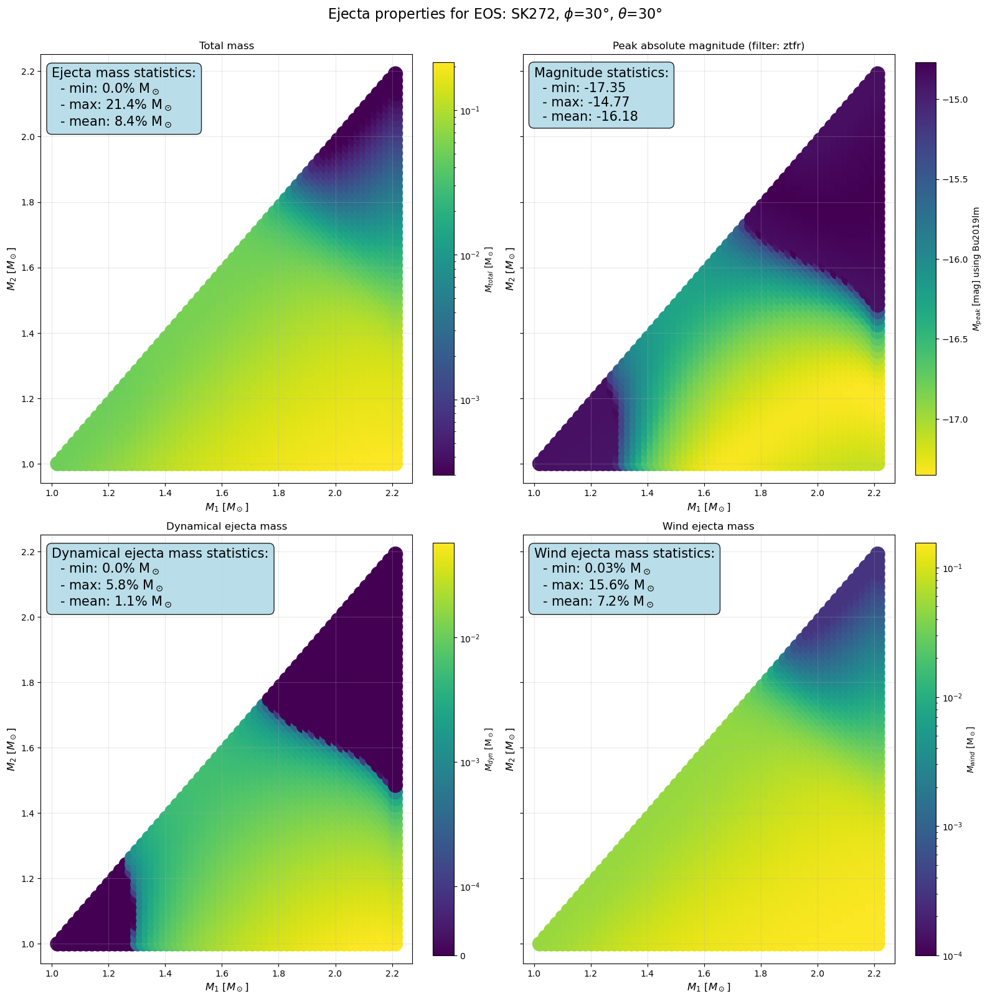

Processing EOS: SLy
Loaded filter ztfr


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


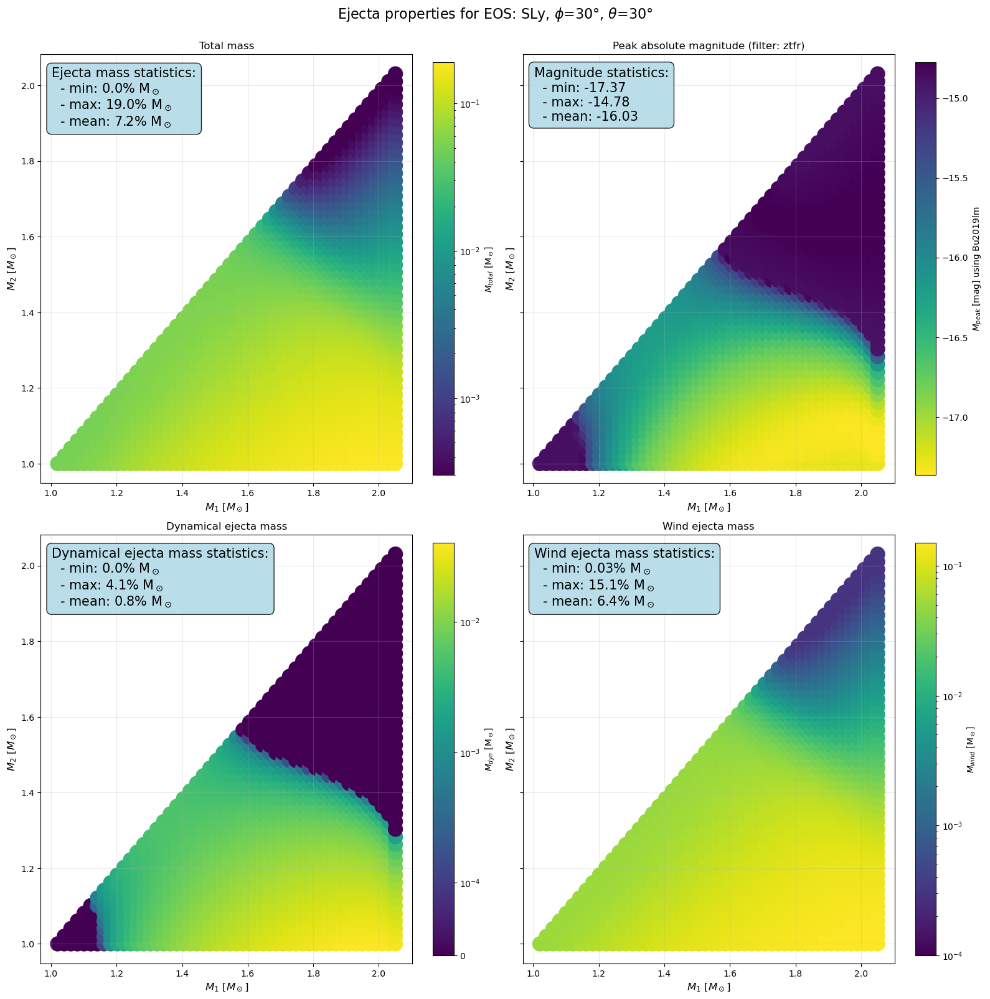

In [17]:
for eos in eos_names:
    figg, axx, dico = ejecta_plot_v3(
        eos_name=eos,
        model_name='Bu2019lm',
        title=f'Ejecta properties for EOS: {eos}, $\phi$=30°, $\\theta$=30°',
        model_param={"luminosity_distance": 0.0, "KNphi": 30.0, "KNtheta": 30.0},
        filters=['ztfr'],
        plot=True,
        get_fig=1
    )
    figg.savefig(f'C:\\Users\\noahj\\Desktop\\ULG\\mémoire\\image\\EOS_influence_ztfr\\{eos}.png', dpi=300)

Plot the color for a "triangle" of mass

Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Loaded filter ps1__i
Loaded filter ps1__g


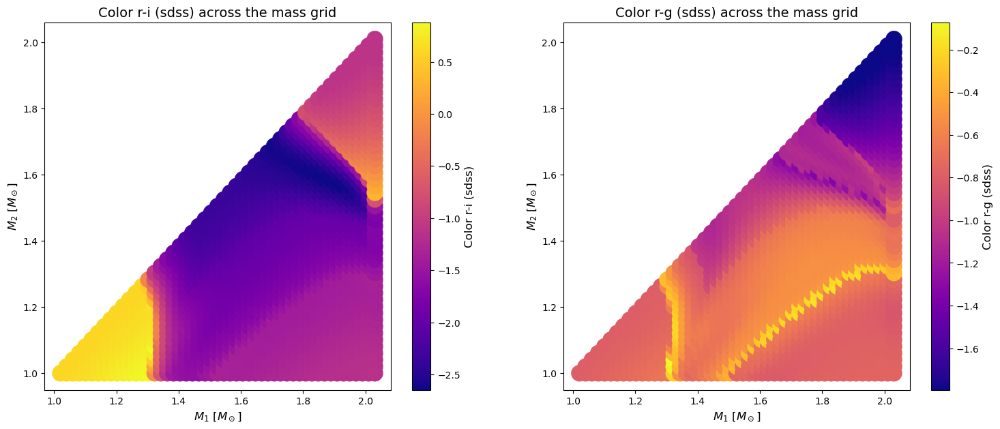

In [ ]:
# initialize model
svd_model = SVDLightCurveModel(
    model='Bu2019lm',
    sample_times=np.arange(0.1, 5.0, 0.1),
    svd_path='/home/liteul/memoir_code/NMMA/svdmodels',
    mag_ncoeff=10,
    lbol_ncoeff=10,
    filters=['ps1__r', 'ps1__i', 'ps1__g']
)
params_list = dic['model_param']
ricol = np.zeros(len(dic['times']))
gcol = np.zeros(len(dic['times']))
for idx, times in enumerate(dic['times']):
    log_10dyn = np.log10(dic['fit_masses'][idx]) if dic['fit_masses'][idx] > 0 else -5 
    log_10wind = np.log10(0.3) + np.log10(dic['wind_linear'][idx])
    params_list.update({
            "log10_mej_dyn": log_10dyn,             
            "log10_mej_wind": log_10wind,   
        })
    _, mag_svd = svd_model.generate_lightcurve(np.arange(0.1, 5.0, 0.1), params_list)
    # computing colors for each point based on peak magnitude
    ricol[idx] = dic['magnitude'][idx] - mag_svd['ps1__i'][int(times)]
    gcol[idx] = dic['magnitude'][idx] - mag_svd['ps1__g'][int(times)]

# Plot
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(18, 7))
axes[0].scatter(dic['pair_array'][:,0], dic['pair_array'][:,1], c=ricol, cmap='plasma', s=300, edgecolors=None, linewidths=0.2)
axes[0].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
axes[0].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
axes[0].set_title('Color r-i (sdss) across the mass grid', fontsize=14)
cbar = plt.colorbar(axes[0].collections[0], ax=axes[0])
cbar.set_label('Color r-i (sdss)', fontsize=12)  
axes[1].scatter(dic['pair_array'][:,0], dic['pair_array'][:,1], c=gcol, cmap='plasma', s=300, edgecolors=None, linewidths=0.2)
axes[1].set_xlabel('$M_1$ [$M_\\odot$]', fontsize=12)
axes[1].set_ylabel('$M_2$ [$M_\\odot$]', fontsize=12)
axes[1].set_title('Color r-g (sdss) across the mass grid', fontsize=14)
cbar = plt.colorbar(axes[1].collections[0], ax=axes[1])
cbar.set_label('Color r-g (sdss)', fontsize=12)  
plt.show()

# Plot of the peak mag in function of $M_{dyn}$ and $M_{wind}$

In [8]:
from tqdm import tqdm

# Define ejecta range
m_dyn = np.logspace(-4, np.log10(0.03), 50)
m_wind = np.logspace(-3, np.log10(0.3), 50)

svd_path = '/home/liteul/memoir_code/NMMA/svdmodels'
tmin_svd, tmax_svd, dt_svd = 0.1, 19.9, 0.1
sample_times_svd = np.arange(tmin_svd, tmax_svd + dt_svd, dt_svd)
svd_model = SVDLightCurveModel(
    model='Bu2019lm',
    sample_times=sample_times_svd,
    svd_path=svd_path,
    mag_ncoeff=10,
    lbol_ncoeff=10,
    filters=['ps1__r']
)
peak_magnitudes = np.full((len(m_dyn), len(m_wind)), np.nan)
for i, d in enumerate(tqdm(m_dyn, desc='Computing peak magnitudes grid', unit='dyn mass')):
    for j, w in enumerate(m_wind):
        parameters = {
            'log10_mej_dyn': np.log10(d),
            'log10_mej_wind': np.log10(w),
            'KNphi': 30,
            'KNtheta': 25.84,
            'luminosity_distance': 0
            }
        _, mags = svd_model.generate_lightcurve(sample_times=sample_times_svd, parameters=parameters)
        peak_magnitudes[i,j]=np.min(mags['ps1__r'])
        
        
# create a ejecta mass grid
X, Y = np.meshgrid(m_dyn, m_wind)
Z = peak_magnitudes.T


Loaded filter ps1__r


/home/liteul/anaconda3/envs/memoir_env/lib/python3.11/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator GaussianProcessRegressor from version 1.0.2 when using version 1.1.3. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
Computing peak magnitudes grid: 100%|██████████| 50/50 [00:25<00:00,  1.95dyn mass/s]


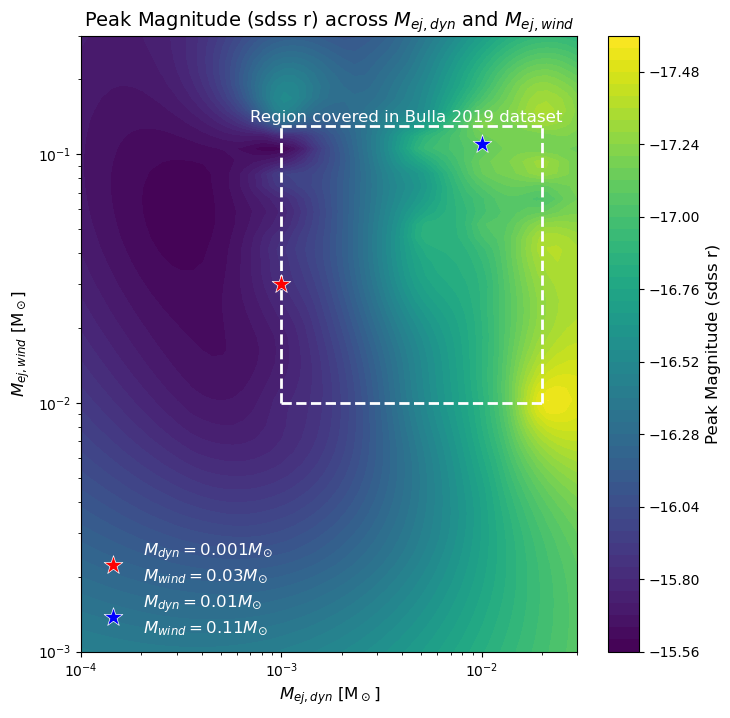

In [84]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8,8))
ax.contourf(
    X,
    Y,
    Z,
    levels=50,
    cmap='viridis_r'
)
ax.scatter(0.001, 0.03, c='red', s=200, marker='*', label='$M_{dyn} = 0.001 M_{\odot}$\n$M_{wind} = 0.03 M_{\odot}$', edgecolors='white', linewidths=0.5, zorder=10)
ax.scatter(0.01, 0.11, c='blue', s=200, marker='*', label='$M_{dyn} = 0.01 M_{\odot}$\n$M_{wind} = 0.11 M_{\odot}$', edgecolors='white', linewidths=0.5)
ax.set_xlabel('$M_{ej,dyn}$ [M$_\odot$]', fontsize=12)
ax.set_ylabel('$M_{ej,wind}$ [M$_\odot$]', fontsize=12)
ax.set_title('Peak Magnitude (sdss r) across $M_{ej,dyn}$ and $M_{ej,wind}$', fontsize=14)
ax.plot([0.001, 0.02], [0.01, 0.01], color='white', linestyle='--', linewidth=2)
ax.plot([0.001, 0.02], [0.13, 0.13], color='white', linestyle='--', linewidth=2)
ax.plot([0.001, 0.001], [0.01, 0.13], color='white', linestyle='--', linewidth=2)
ax.plot([0.02, 0.02], [0.01, 0.13], color='white', linestyle='--', linewidth=2)
ax.text(0.0007, 0.135, 'Region covered in Bulla 2019 dataset', color='white', fontsize=12)
ax.set_xscale('log')
ax.set_yscale('log')
ax.legend(fontsize=12, loc='lower left', framealpha=0.0, labelcolor='white')
cbar = plt.colorbar(ax.collections[0], ax=ax)
cbar.set_label('Peak Magnitude (sdss r)', fontsize=12)
cbar.ax.invert_yaxis()
plt.show()

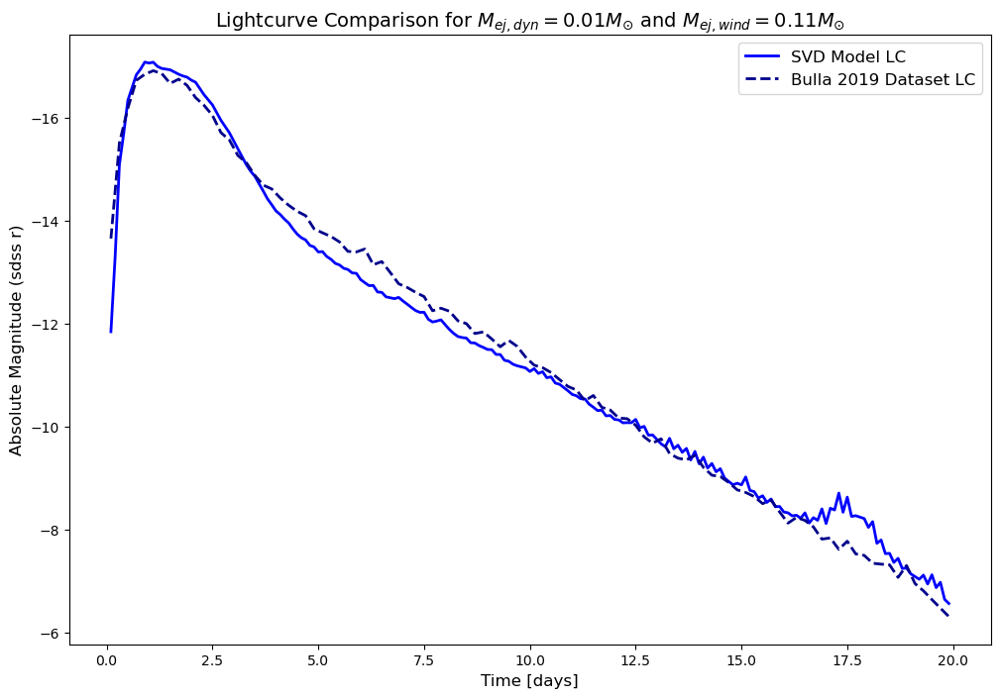

In [61]:
fig , ax = plt.subplots(figsize=(12, 8))

# Plot dataset lc and nmma lc corresponding to (0.01, 0.11)
log_10dyn = np.log10(0.01)
log_10wind = np.log10(0.11)
parameters.update({
        "log10_mej_dyn": log_10dyn,             
        "log10_mej_wind": log_10wind,   
    })
_, mag_svd = svd_model.generate_lightcurve(np.arange(0.1, 20.0, 0.1), parameters)
ax.plot(np.arange(0.1, 20.0, 0.1), mag_svd['ps1__r'], label='SVD Model LC', color='blue', linewidth=2)
# find the corresponding dataset file
file_info = bulla_dataset.get_file(mejdyn=0.01, mejwind=0.11, phi=30, theta=25.84, dMpc=0, load_data=True)
if file_info:
    if file_info['data'] is None:
        file_info['data'] = np.loadtxt(file_info['filepath'])
        file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
    data = file_info['data']
    if 'ps1::r' in file_info['filters']:
        filter_idx = file_info['filters'].index('ps1::r')
        times = data[:, 0]
        magnitudes = data[:, filter_idx + 1]
        ax.plot(times, magnitudes, label='Bulla 2019 Dataset LC', color='darkblue', linestyle='--', linewidth=2)
ax.invert_yaxis()
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Absolute Magnitude (sdss r)', fontsize=12)
ax.set_title('Lightcurve Comparison for $M_{ej,dyn}=0.01 M_{\odot}$ and $M_{ej,wind}=0.11 M_{\odot}$', fontsize=14)
ax.legend(fontsize=12)
plt.show()

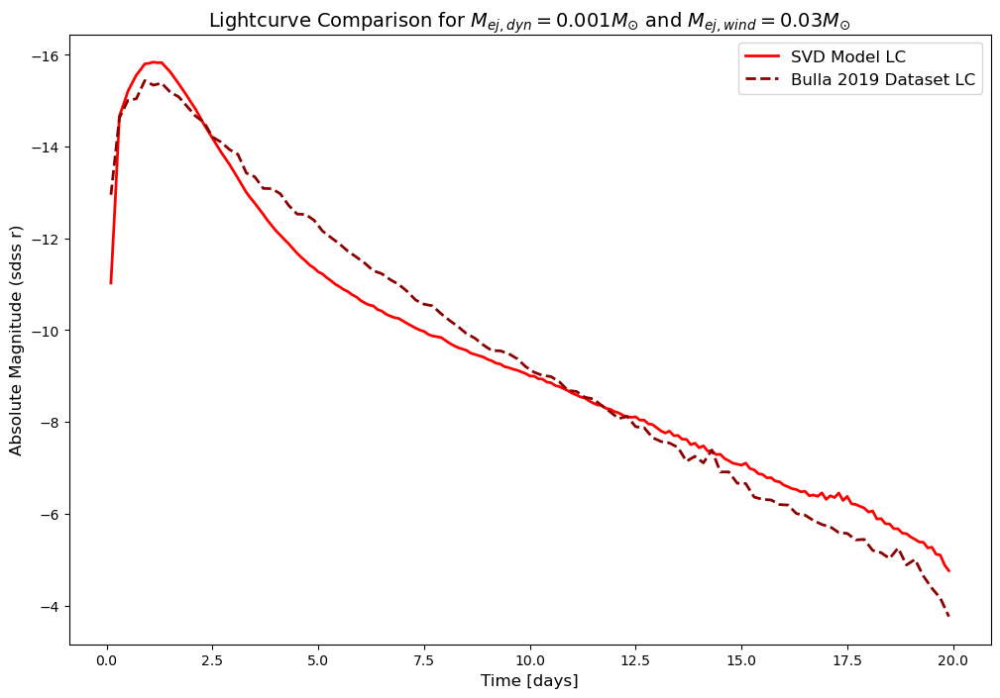

In [62]:
fig , ax = plt.subplots(figsize=(12, 8))

# Plot dataset lc and nmma lc corresponding to (0.001, 0.03)
log_10dyn = np.log10(0.001)
log_10wind = np.log10(0.03)
parameters.update({
        "log10_mej_dyn": log_10dyn,             
        "log10_mej_wind": log_10wind,   
    })
_, mag_svd = svd_model.generate_lightcurve(np.arange(0.1, 20.0, 0.1), parameters)
ax.plot(np.arange(0.1, 20.0, 0.1), mag_svd['ps1__r'], label='SVD Model LC', color='red', linewidth=2)
# find the corresponding dataset file
file_info = bulla_dataset.get_file(mejdyn=0.001, mejwind=0.03, phi=30, theta=25.84, dMpc=0, load_data=True)
if file_info:
    if file_info['data'] is None:
        file_info['data'] = np.loadtxt(file_info['filepath'])
        file_info['filters'] = bulla_dataset._extract_filters(file_info['filepath'])
    data = file_info['data']
    if 'ps1::r' in file_info['filters']:
        filter_idx = file_info['filters'].index('ps1::r')
        times = data[:, 0]
        magnitudes = data[:, filter_idx + 1]
        ax.plot(times, magnitudes, label='Bulla 2019 Dataset LC', color='darkred', linestyle='--', linewidth=2)
ax.invert_yaxis()
ax.set_xlabel('Time [days]', fontsize=12)
ax.set_ylabel('Absolute Magnitude (sdss r)', fontsize=12)
ax.set_title('Lightcurve Comparison for $M_{ej,dyn}=0.001 M_{\odot}$ and $M_{ej,wind}=0.03 M_{\odot}$', fontsize=14)
ax.legend(fontsize=12)
plt.show()